## Time Series Classification Class

In [ ]:
!pip install numpy matplotlib scikit-learn aeon==1.0.0 tslearn tensorflow pyts

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, hamming_loss, classification_report, confusion_matrix
from sklearn.metrics import rand_score, adjusted_rand_score, homogeneity_score, completeness_score, v_measure_score, homogeneity_completeness_v_measure
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import describe, skew, kurtosis
from aeon.datasets import load_classification
from tslearn.clustering import TimeSeriesKMeans
from pyts.classification import KNeighborsClassifier, LearningShapelets
import time
import joblib
from scipy.interpolate import interp1d
import pandas as pd

pd.options.display.max_columns = None
pd.options.display.max_rows = None

import inspect

import warnings
warnings.filterwarnings('ignore')

In [ ]:
class TimeSeriesClassifier:
	def __init__(self):
		self.meta_data = None
		self.X_train = None
		self.X_test = None
		self.y_train = None
		self.y_test = None
		self.dataset_name = None

	def get_data(self, dataset_name, print_info=False):
		X_train, y_train, meta_data = load_classification(dataset_name, split="train", return_metadata=True)
		X_test, y_test = load_classification(dataset_name, split="test")

		self.X_train = X_train
		self.y_train = y_train
		self.X_test = X_test
		self.y_test = y_test
		self.dataset_name = dataset_name
		self.meta_data = meta_data

	def print_info(self):
		print("Dataset:", self.dataset_name)
		print("Shape of X_TRAIN:", self.X_train.shape)
		print("Shape of X_TEST:", self.X_test.shape)
		print("Labels:", np.unique(self.y_train))
		#print("First case:", X_train[0][0], " has label:", y_train[0])
		#print("Meta data:", self.meta_data)
		#print(type(self.X_train))

	def print_stats_for_label(self, plot_dataset=False):
		"""
		Print statistics for each label in the dataset and plot the mean, median, variance, min, and max
		of the features for each label.

		Parameters:
			X (np.ndarray): Feature matrix (n_samples x n_features).
			y (np.ndarray): Labels corresponding to each sample.
			dataset_name (str): Name of the dataset for display in the plots.
		"""
		X = self.flatten_dataset(self.X_train)
		unique_labels = np.unique(self.y_train)

		for label in unique_labels:
			indices = np.where(self.y_train == label)[0]
			label_data = X[indices]

			# compute statistics
			stats = describe(label_data, axis=0)
			mean = stats.mean
			std_dev = np.sqrt(stats.variance)

			# calculate the 3 sigma range
			upper_3sigma = mean + 3 * std_dev
			lower_3sigma = mean - 3 * std_dev

			plt.figure(figsize=(12, 6))

			for idx in indices:
				plt.plot(X[idx].flatten(), f'C{7}', alpha=0.2, linewidth=0.8, zorder=-1)

			plt.plot(mean, label="Mean", color='C0', linewidth=3)
			plt.plot(lower_3sigma, label="-3σ", color='C1', linewidth=3)
			plt.plot(upper_3sigma, label="+3σ", color='C1', linewidth=3)
			plt.fill_between(np.arange(len(mean)), lower_3sigma, upper_3sigma, color='red', alpha=0.1, label="±3σ Range")
			plt.title(f"Data with Mean and ±3σ Range for Label {label} - {self.dataset_name}")
			plt.legend()
			plt.grid()
			plt.show()


		for label in unique_labels:
			indices = np.where(self.y_train == label)[0]
			label_data = X[indices]

			# compute statistics
			stats = describe(label_data, axis=0)
			mean = stats.mean
			median = np.median(label_data, axis=0)
			variance = stats.variance
			min_values = stats.minmax[0]
			max_values = stats.minmax[1]

			# plot statistics
			fig, ax1 = plt.subplots(figsize=(14, 7))
			ax1.plot(mean, label="Mean", color='C0', linewidth=3)
			ax1.plot(median, label="Median", color='C1', linewidth=3)
			ax1.plot(min_values, label="Min", color='C2', linewidth=3)
			ax1.plot(max_values, label="Max", color='C3', linewidth=3)

			if plot_dataset:
				for idx in indices:
					# 7 - light gray, 8 - light lemon, 9 - light blue
					ax1.plot(X[idx].flatten(), f'C{7}', alpha=0.2, linewidth=0.8, zorder=-1)
			ax1.set_xlabel("Time Index")
			ax1.set_ylabel("Other statistics", color='C0')
			ax1.tick_params(axis='y', labelcolor='C0')

			# add a secondary y-axis for variance
			ax2 = ax1.twinx()
			ax2.plot(variance, label="Variance", color='C9', linewidth=3, linestyle=(0, (5, 1)))
			ax2.set_ylabel("Variance", color='C9')
			ax2.tick_params(axis='y', labelcolor='C9')
			ax1.legend(loc="upper left")
			ax2.legend(loc="upper right")
			plt.title(f"Statistics for Label {label} - {self.dataset_name}")
			plt.tight_layout()
			plt.show()


		for label in unique_labels:
			indices = np.where(self.y_train == label)[0]
			label_data = X[indices]
			num_quantiles = 5
			quantile_values = np.linspace(0, 1, num_quantiles)
			quantiles = np.quantile(label_data, quantile_values, axis=0)

			linestyle_map = ["--", ":", "-", ":", "--"] # there is also "-."

			plt.figure(figsize=(12, 6))
			for idx in range(0, num_quantiles):
				plt.plot(quantiles[idx], color='C0', label=f"{quantile_values[idx]}", linestyle=linestyle_map[idx])

			plt.title(f"Quantiles for Label {label} - {self.dataset_name}")
			plt.legend()
			plt.show()

	def print_stats(self, plot_dataset=False):
		plt.figure(figsize=(12, 6))
		for label in np.unique(self.y_train):
			indices = np.where(self.y_train == label)[0]
			for i, idx in enumerate(indices):
				plt.plot(self.X_train[idx].flatten(), f'C{label}', linewidth=1)
		plt.title("Time Series for Each Class")
		plt.legend()
		plt.show()

		for label in np.unique(self.y_train):
			indices = np.where(self.y_train == label)[0]
			plt.figure(figsize=(12, 6))
			for i, idx in enumerate(indices):
				plt.plot(self.X_train[idx].flatten(), f'C{label}', linewidth=1)
			plt.title(f"Time Series for {label} Class")
			plt.legend()
			plt.show()

		# PCA for dimensionality reduction
		pca = PCA(n_components=2)
		X_pca = pca.fit_transform(self.flatten_dataset(self.X_train)) # don't know why flatten doesn't work

		plt.figure(figsize=(10, 6))
		for label in np.unique(self.y_train):
			indices = np.where(self.y_train == label)
			plt.scatter(X_pca[indices, 0], X_pca[indices, 1], label=f"Class {label}", alpha=0.7)
		plt.title("PCA of Time Series Data")
		plt.xlabel("PCA1")
		plt.ylabel("PCA2")
		plt.legend()
		plt.show()
		self.print_stats_for_label(plot_dataset)

	def slope(self, y):
		slope, _ = np.polyfit(range(len(y)), y, 1)
		return slope

	# feature engineering with sliding window
	def sliding_window_statistics(self, window_size, step_size, statistics):
		"""
		Computes specified statistics for each sliding window over the time series data.

		Parameters:
		- data: List of time series data.
		- window_size: The size of the sliding window.
		- step_size: The step size for the sliding window.
		- statistics: List of statistics to compute. Possible values include:
		'mean', 'median', 'std', 'min', 'max', 'amplitude', 'sum', 'skewness', 'kurtosis', 'slope'.

		Returns:
		- features: A 3D array -> [series][window][features]
		"""
		# create a list of functions that correspond to the desired statistics
		stat_functions = {
			'mean': np.mean,
			'median': np.median,
			'std': np.std,
			'min': np.min,
			'max': np.max,
			'amplitude': lambda x: np.max(x) - np.min(x),
			'sum': np.sum,
			'skewness': skew,
			'kurtosis': kurtosis,
			'slope': lambda x: self.slope(x)
		}

		features = []

		for series in self.X_train:
			series = series[0]
			series_features = []

			# create sliding windows using numpy's sliding_window_view
			windows = np.lib.stride_tricks.sliding_window_view(series, window_size)[::step_size]

			for stat in statistics:
				if stat in stat_functions:
					# apply the corresponding statistic function to each window
					stat_func = stat_functions[stat]
					stat_values = np.apply_along_axis(stat_func, axis=1, arr=windows)
					series_features.append(stat_values)

			# stack the features vertically (axis=1) so each row corresponds to one window
			series_features = np.stack(series_features, axis=1)
			features.append(series_features)

		features = np.array(features, dtype=object)
		# ensure all feature vectors are of the same length by padding/truncation
		max_length = max(len(f) for f in features)
		features = np.array([np.pad(f, ((0, max_length - len(f)), (0, 0)), 'constant') for f in features])
		self.X_train = features

		features = []
		for series in self.X_test:
			series = series[0]
			series_features = []

			# create sliding windows using numpy's sliding_window_view
			windows = np.lib.stride_tricks.sliding_window_view(series, window_size)[::step_size]

			for stat in statistics:
				if stat in stat_functions:
					# apply the corresponding statistic function to each window
					stat_func = stat_functions[stat]
					stat_values = np.apply_along_axis(stat_func, axis=1, arr=windows)
					series_features.append(stat_values)

			# stack the features vertically (axis=1) so each row corresponds to one window
			series_features = np.stack(series_features, axis=1)
			features.append(series_features)

		features = np.array(features, dtype=object)
		# ensure all feature vectors are of the same length by padding/truncation
		max_length = max(len(f) for f in features)
		features = np.array([np.pad(f, ((0, max_length - len(f)), (0, 0)), 'constant') for f in features])
		self.X_test = features


	def print_classification_report(self, y, y_pred, task, dataset_type, dataset_name, modification_description):
		print(f"{task} Classification Report for {modification_description} - {dataset_name} ({dataset_type}):")
		print(classification_report(y, y_pred))

	def print_confusion_matrix(self, y, y_pred, task, dataset_type, dataset_name, modification_description, plot_confusion_matrix=False, print_metrics=False):
		print(f"{task} Confusion Matrix for {modification_description} - {dataset_name} ({dataset_type}):")
		print(confusion_matrix(y, y_pred))

		if plot_confusion_matrix: # unused (repeated result)
			plt.figure(figsize=(14, 6))
			plt.imshow(confusion_matrix(y, y_pred), cmap="Blues", interpolation="nearest")
			plt.title(f"{task} Confusion Matrix for {modification_description}\n{dataset_name} ({dataset_type})")
			plt.colorbar()
			plt.xlabel("Predicted")
			plt.ylabel("True")
			plt.show()

		if print_metrics:
			# evaluate k-Means clustering against true labels (homogeneity)
			# we can perform all at once -> homogeneity_completeness_v_measure
			homogeneity = homogeneity_score(self.y_test, y_pred)
			completeness = completeness_score(self.y_test, y_pred)
			v_measure = v_measure_score(self.y_test, y_pred)
			rand = rand_score(self.y_test, y_pred)
			adjusted_rand = adjusted_rand_score(self.y_test, y_pred)
			print(f"Homogeneity Score for {task}: {homogeneity:.2f}")
			print(f"Completeness Score for {task}: {completeness:.2f}")
			print(f"V-measure Score for {task}: {v_measure:.2f}")
			print(f"Rand Score for {task}: {rand:.2f}")
			print(f"Adjusted Rand Score for {task}: {adjusted_rand:.2f}")

	def print_report(self, y, y_pred, task, dataset_type, dataset_name, modification_description):
		self.print_classification_report(y, y_pred, task, dataset_type, dataset_name, modification_description)
		self.print_confusion_matrix(y, y_pred, task, dataset_type, dataset_name, modification_description)

	def print_score(self, model, x, y, task, dataset_type, dataset_name, modification_description):
		print(f"{task} Score for {modification_description} - {dataset_name} ({dataset_type}):", model.score(x, y))

	def print_report_for_model(self, model, task, modification_description, print_train=False, print_score=False):
		y_pred_train = model.predict(self.flatten_dataset(self.X_train))
		y_pred_test = model.predict(self.flatten_dataset(self.X_test))

		if print_train:
			self.print_report(self.y_train, y_pred_train, task, "train", self.dataset_name, modification_description)
			if print_score:
				print_score(model, self.flatten_dataset(self.X_train), self.y_train, task, "train", self.dataset_name, modification_description)

		self.print_report(self.y_test, y_pred_test, task, "test", self.dataset_name, modification_description)
		if print_score:
			print_score(model, self.flatten_dataset(self.X_test), self.y_test, task, "test", self.dataset_name, modification_description)
		return y_pred_train, y_pred_test

	def measure_time(self, t=None): # unused
		if t is not None:
			print(f"Elapsed time: {time.time() - t:.4f} seconds")
		return time.time()

	# k-Nearest Neighbors Classification
	def print_knn(self, modification_description):
		knn = KNeighborsClassifier(n_jobs=-1) # n_neighbors=1, metric='minkowski', p=2 (default arguments -> Euclidean Distance)
		knn.fit(self.flatten_dataset(self.X_train), self.y_train)
		self.print_report_for_model(knn, "kNN", modification_description)

	# k-Means Clustering - Euclidean Distance
	def print_kmeans(self, modification_description):
		num_clusters = len(np.unique(self.y_test))
		kmeans = KMeans(n_clusters=num_clusters, random_state=42)
		kmeans.fit(self.flatten_dataset(self.X_test))
		centroids = kmeans.cluster_centers_
		pca = PCA(n_components=2)
		X_pca = pca.fit_transform(self.flatten_dataset(self.X_test))

		# visualize k-Means clustering results on PCA-reduced data
		labels_kmeans = kmeans.labels_
		plt.figure(figsize=(10, 6))
		plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels_kmeans, cmap="viridis", alpha=0.7)
		plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
		plt.title("k-Means Clustering on PCA Reduced Data")
		plt.xlabel("PCA1")
		plt.ylabel("PCA2")
		plt.colorbar(label="Cluster")
		plt.show()

		# confussion matrix
		self.print_confusion_matrix(self.y_test, labels_kmeans, "k-Means", "test", self.dataset_name, modification_description, print_metrics=True)

	# k-Means - DTW Distance
	def print_kmeans_dtw(self, modification_description):
		num_clusters = len(np.unique(self.y_test))
		tskmeans = TimeSeriesKMeans(n_clusters=num_clusters, metric='dtw', tol=1e-4, n_jobs=-1)
		tskmeans.fit(self.flatten_dataset(self.X_test))
		self.print_confusion_matrix(self.y_test, tskmeans.labels_, "k-Means DTW", "test", self.dataset_name, modification_description, print_metrics=True)

	# Shapelets
	def print_shapelets(self, modification_description):
		shapelets_classifier = LearningShapelets(tol=1e-3, max_iter=2000, n_jobs=-1) # Maybe more iterations?
		shapelets_classifier.fit(self.flatten_dataset(self.X_train), self.y_train)
		self.print_report_for_model(shapelets_classifier, "Shapelets", modification_description, print_score=False)
		print('Number of shapelets: %d' % shapelets_classifier.shapelets_.shape[1])
		fig, axs = plt.subplots(4, 4, figsize=(12, 12), sharex='all', sharey='all')
		for i in range(16):
			axs[i // 4, i % 4].plot(shapelets_classifier.shapelets_[0, i], 'b', color='C0')
			axs[i // 4, i % 4].set_title('Shapelet %d' % (i+1))

	# k-Nearest Neighbors Classification with DTW distance
	def print_knn_dtw(self, modification_description):
		knn = KNeighborsClassifier(metric='dtw', n_jobs=-1)
		knn.fit(self.flatten_dataset(self.X_train), self.y_train)
		self.print_report_for_model(knn, "kNN DTW", modification_description, print_score=False)

	# Random Forest Classification
	def print_random_forest(self, modification_description):
		rf_classifier = RandomForestClassifier(n_estimators=100, min_samples_leaf=1, random_state=42)
		rf_classifier.fit(self.flatten_dataset(self.X_train), self.y_train)
		self.print_report_for_model(rf_classifier, "Random Forest", modification_description)

	def idx_shape2flat(self, window_index, feature_index, num_features):
		idx = window_index * num_features + feature_index
		return idx

	def idx_flat2shape(self, idx, num_features):
		window_index = idx // num_features
		feature_index = idx % num_features
		return window_index, feature_index

	# probably needs fix
	def print_feature_importance(self, feature_names):
		rf_classifier = RandomForestClassifier(n_estimators=100, min_samples_leaf=1, random_state=42)
		rf_classifier.fit(self.flatten_dataset(self.X_train), self.y_train)

		num_features = len(feature_names)

		importances = rf_classifier.feature_importances_
		original_idxs = range(len(importances))
		# feature_infos = np.array([idx_flat2shape(idx, num_features) for idx in original_idxs])
		# window_idxs = feature_infos[:, 0].astype(int)
		# feature_idxs = feature_infos[:, 1].astype(int)
		# features = [feature_names[idx] for idx in feature_idxs]

		reshaped_indices = np.reshape(original_idxs, (-1, num_features))

		# extract window_index (rows) and feature_index (columns)
		window_idxs = reshaped_indices // num_features
		feature_idxs = reshaped_indices % num_features

		window_idxs = window_idxs.flatten()
		feature_idxs = feature_idxs.flatten()

		features = [feature_names[idx] for idx in feature_idxs]

		feature_importance_df = pd.DataFrame({'Original index': original_idxs, 'Feature': features, 'Window index': window_idxs, 'Feature index': feature_idxs, 'Importance': importances})

		# top = 100 # 50
		# feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
		# print(feature_importance_df.head(top))

		# top_features = feature_importance_df['Original index'][:top].values
		# print(top_features)
		top = 100 # 50
		feature_importance_df = feature_importance_df.nlargest(top, 'Importance', keep='all')
		print(feature_importance_df)

		top_features = feature_importance_df['Original index'].values
		print(top_features)
		return top_features

	# unused, but left because it might be usefull (propably needs fix)
	def create_top_features_dataset(self, statistics):
		top_features = self.print_feature_importance(statistics)

		self.X_train = self.X_train[:, top_features]
		self.X_test = self.X_test[:, top_features]

	def scale_data(self):
		# normalize each feature separately ("column-wise")
		scaler = StandardScaler()

		# initialize an empty array to store normalized data
		normalized_X_train = np.copy(self.X_train)
		normalized_X_test = np.copy(self.X_test)

		for feature_idx in range(self.X_train.shape[2]):
			# extract the feature data across all time series and windows
			feature_X_train = self.X_train[:, :, feature_idx]
			feature_X_test = self.X_test[:, :, feature_idx]

			# reshape the feature data into a 2D array
			feature_X_train_reshaped = feature_X_train.reshape(-1, 1)
			feature_X_test_reshaped = feature_X_test.reshape(-1, 1)
			normalized_feature_X_train = scaler.fit_transform(feature_X_train_reshaped).flatten()
			normalized_feature_X_test = scaler.transform(feature_X_test_reshaped).flatten()

			# reshape back to the original shape
			normalized_X_train[:, :, feature_idx] = normalized_feature_X_train.reshape(self.X_train.shape[0], self.X_train.shape[1])
			normalized_X_test[:, :, feature_idx] = normalized_feature_X_test.reshape(self.X_test.shape[0], self.X_test.shape[1])
		self.X_train = normalized_X_train
		self.X_test = normalized_X_test

	def flatten_dataset(self, X):
		flat_X = X.reshape(X.shape[0], -1)
		return flat_X

	def prepare_data_for_testing(self, dataset_name, test_size=0.2):
		X, y = load_classification(dataset_name)
		X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)

		self.X_train = X_train
		self.X_test = X_test
		self.y_train = y_train
		self.y_test = y_test

	def augment_data(self, method="jitter", noise_factor=0.01, scale_range=(0.9, 1.1), warp_factor=0.2):
		augmented_X = []
		augmented_Y = []
		for i, series in enumerate(self.X_train):
			if method == "jitter":
				augmented_series = series + np.random.normal(0, noise_factor, series.shape)
				# Add random noise

			elif method == "scaling":
				# Scale the series
				scale = np.random.uniform(scale_range[0], scale_range[1])
				augmented_series = series * scale

			elif method == "time_warp":
				# Stretch or compress time
				time_steps = np.arange(len(series))
				warp_steps = np.linspace(0, len(series) - 1, int(len(series) * np.random.uniform(1 - warp_factor, 1 + warp_factor)))
				interpolator = interp1d(warp_steps, series, kind="linear", fill_value="extrapolate")
				augmented_series = interpolator(time_steps)

			elif method == "window_slice":
				# Select a random window
				window_size = int(len(series) * 0.8)  # Use 80% of the series length
				start_idx = np.random.randint(0, len(series) - window_size)
				augmented_series = series[start_idx : start_idx + window_size]
				# Pad to original length
				augmented_series = np.pad(augmented_series, (0, len(series) - len(augmented_series)), mode="constant")

			elif method == "window_warp":
				# Stretch/shrink random window
				start_idx = np.random.randint(0, len(series) // 2)
				end_idx = np.random.randint(len(series) // 2, len(series))
				window = series[start_idx:end_idx]
				warp_steps = np.linspace(0, len(window) - 1, int(len(window) * np.random.uniform(0.8, 1.2)))
				interpolator = interp1d(warp_steps, window, kind="linear", fill_value="extrapolate")
				warped_window = interpolator(np.arange(len(window)))
				augmented_series = np.concatenate([series[:start_idx], warped_window, series[end_idx:]])

			elif method == "permutation":
				# Permute smaller subsequences
				n_permutations = 4
				permuted = np.array_split(series, n_permutations)
				np.random.shuffle(permuted)
				augmented_series = np.concatenate(permuted)

			augmented_X.append(augmented_series)
			augmented_Y.append(self.y_train[i])

			self.X_train = np.concatenate((np.array(augmented_X), self.X_train), axis=0)
			self.y_train = np.concatenate((np.array(augmented_Y), self.y_train), axis=0)

	def feature_engineer_data(self, window_length=20, step_length=10, statistics=['mean', 'median', 'std', 'slope', 'skewness', 'kurtosis']):
		self.sliding_window_statistics(window_length, step_length, statistics)

	def run(self, print_EDA=False, shapelets=False):
		# encode labels to numeric values (if we will need this in the future)
		le = LabelEncoder()
		self.y_train = le.fit_transform(self.y_train)
		self.y_test = le.transform(self.y_test)

		if print_EDA:
			self.print_stats() # plot_dataset=True
		#self.scale_data() - I think it gives worse results when you scale
		self.print_knn("test set")
		print("")
		self.print_kmeans("test set")
		print("")
		self.print_random_forest("test set")
		print("")
		self.print_knn_dtw("test set")
		print("")
		self.print_kmeans_dtw("test set")
		if shapelets:
			print("")
			self.print_shapelets("test set")

	def save_model(self, filepath):
		joblib.dump(self.model, filepath)

	def load_model(self, filepath):
		self.model = joblib.load(filepath)

## ArrowHead Test

In [ ]:
model = TimeSeriesClassifier()
model.get_data("ArrowHead")
model.print_info()

Dataset: ArrowHead
Shape of X_TRAIN: (36, 1, 251)
Shape of X_TEST: (175, 1, 251)
Labels: ['0' '1' '2']


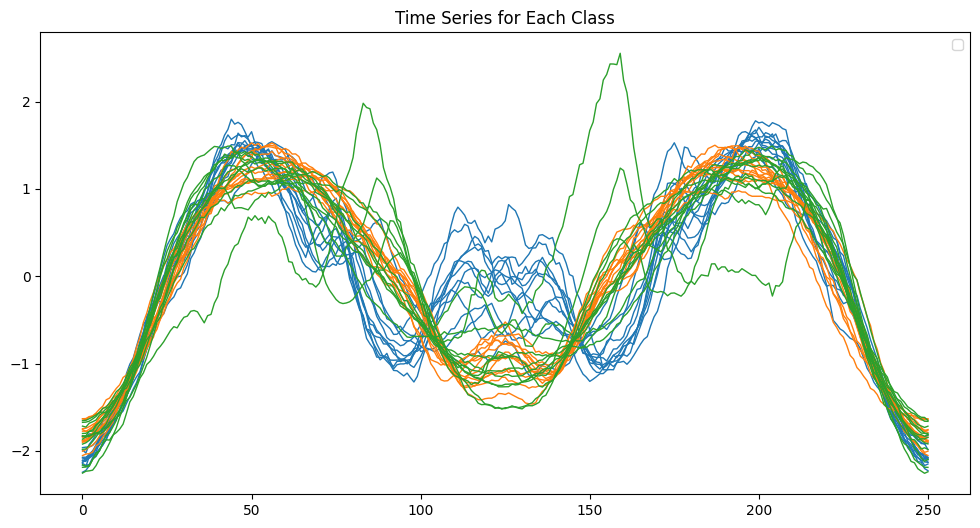

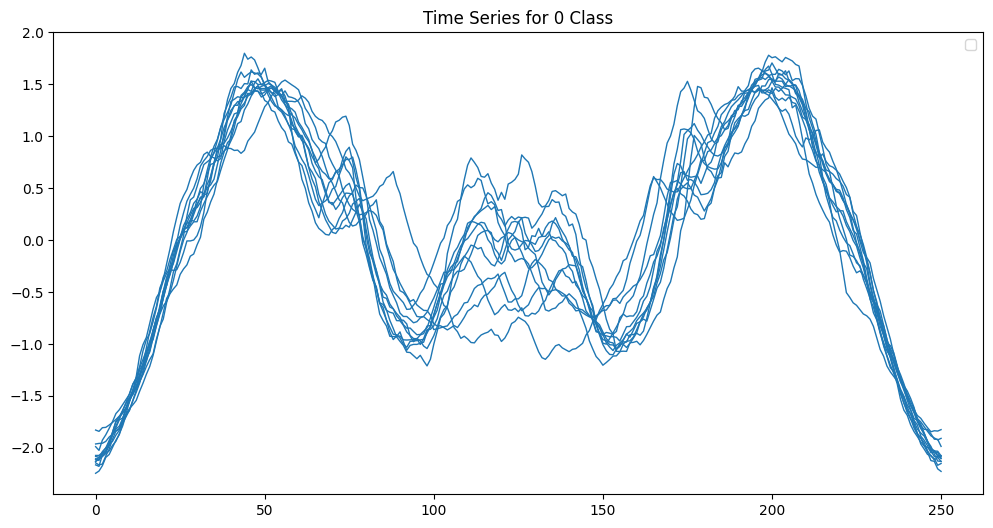

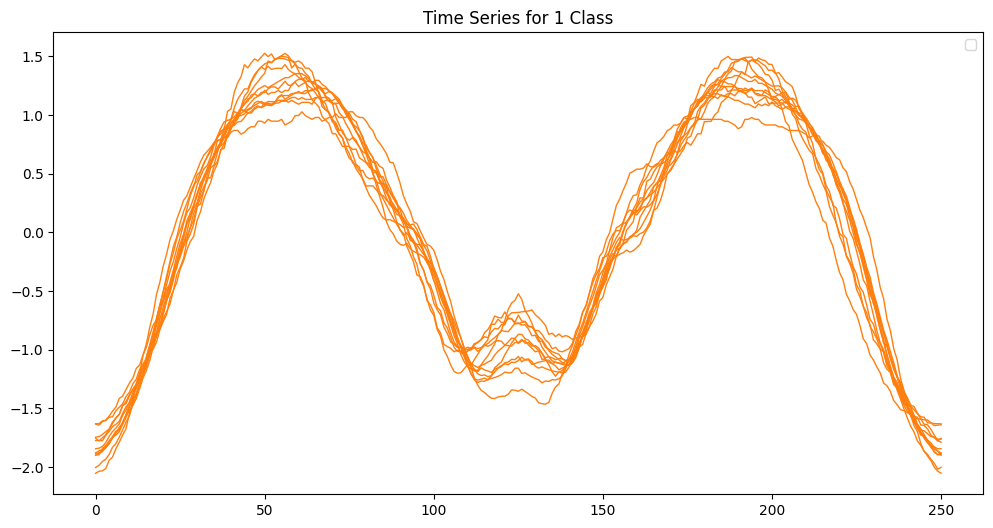

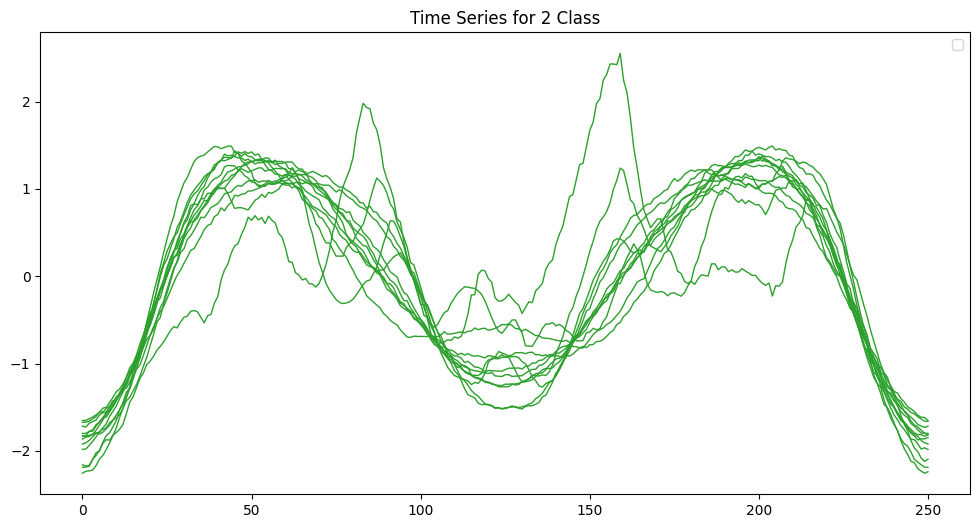

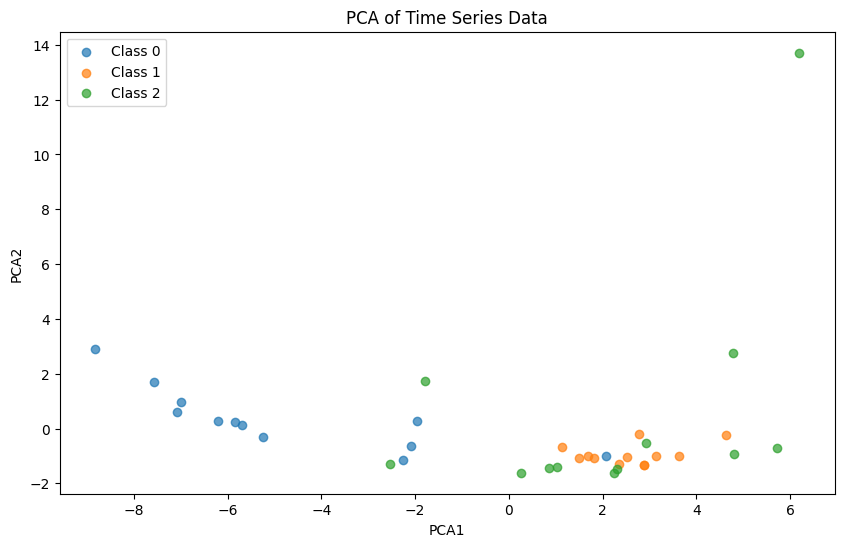

...

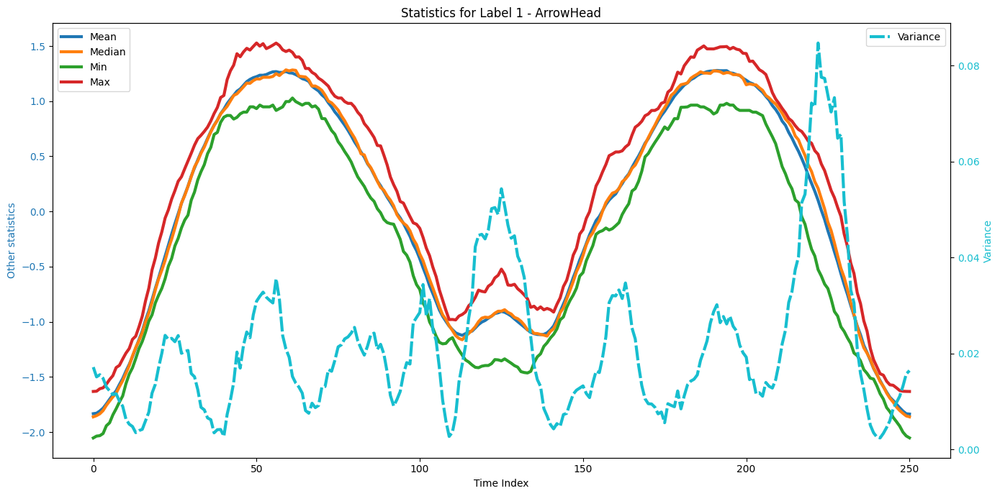

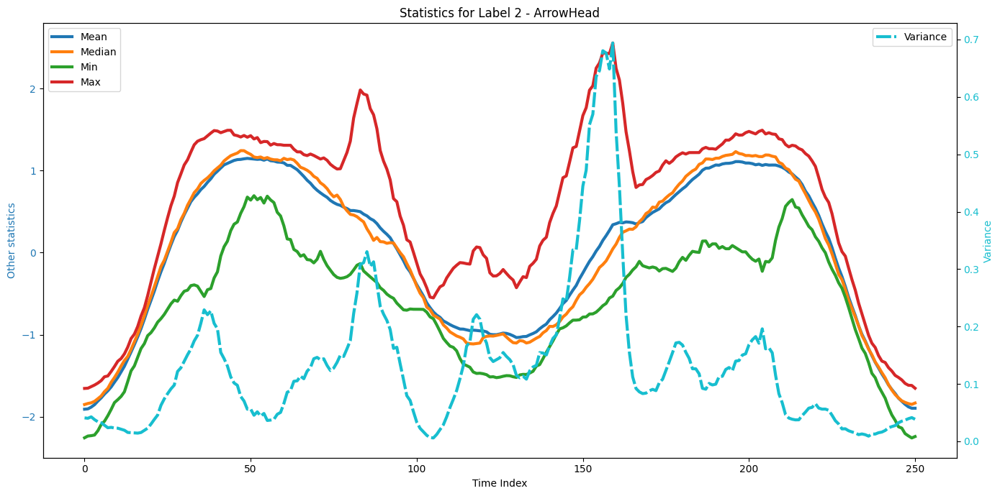

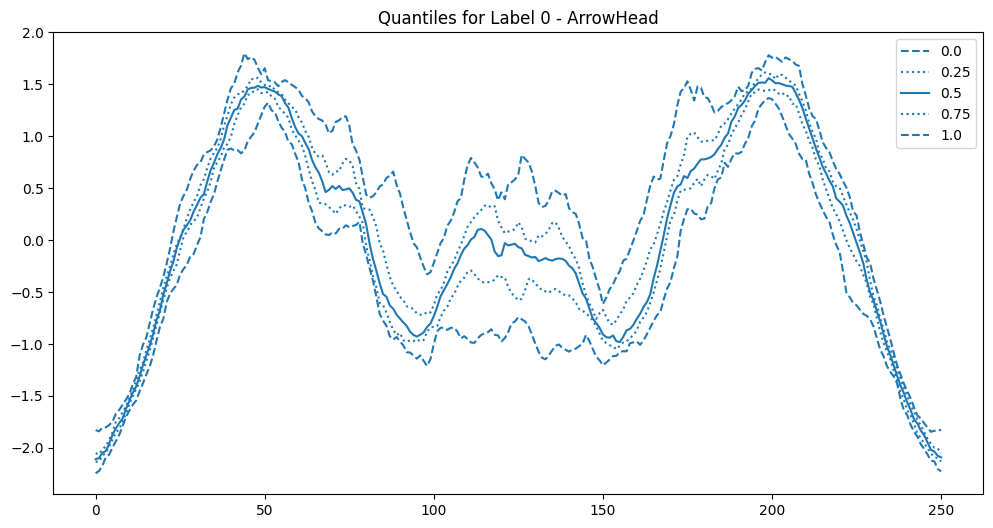

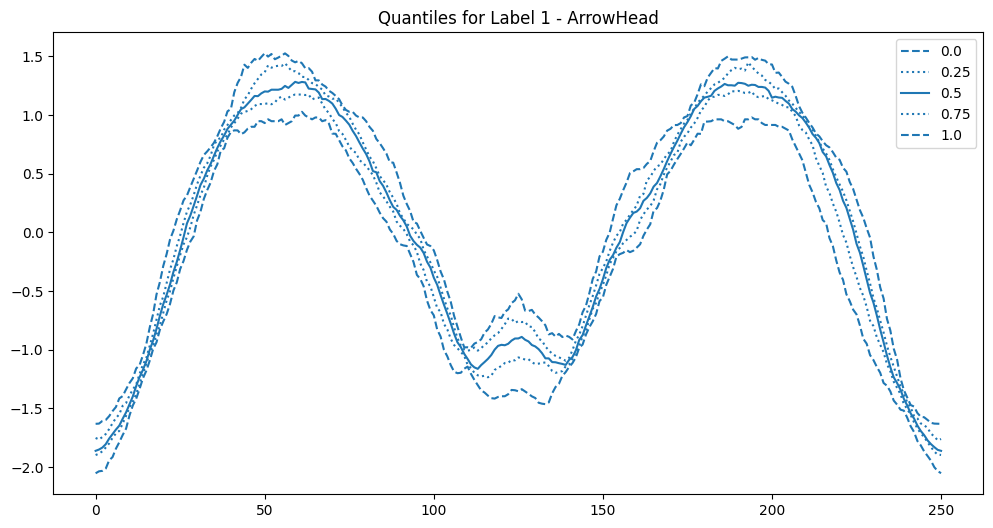

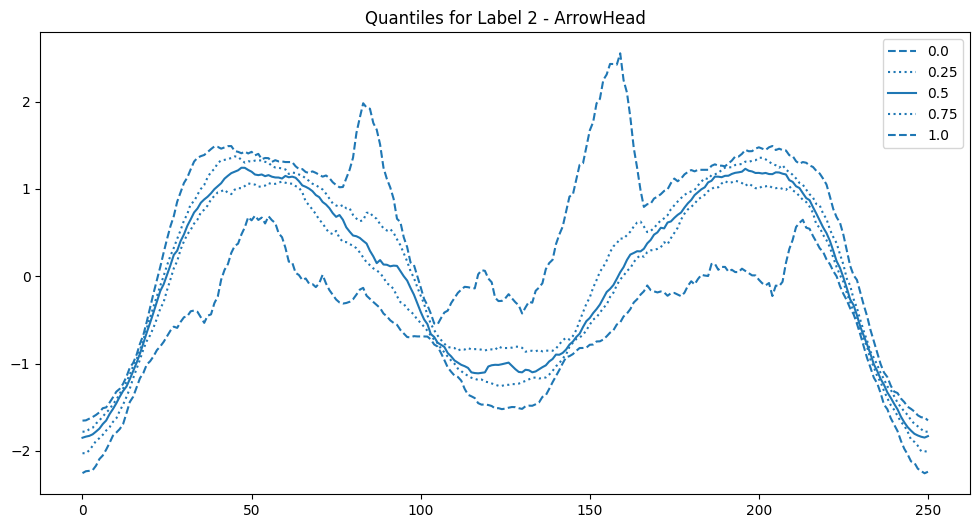

kNN Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.94      0.70      0.80        69
           1       0.73      0.89      0.80        53
           2       0.75      0.85      0.80        53

    accuracy                           0.80       175
   macro avg       0.81      0.81      0.80       175
weighted avg       0.82      0.80      0.80       175

kNN Confusion Matrix for test set - ArrowHead (test):
[[48 10 11]
 [ 2 47  4]
 [ 1  7 45]]



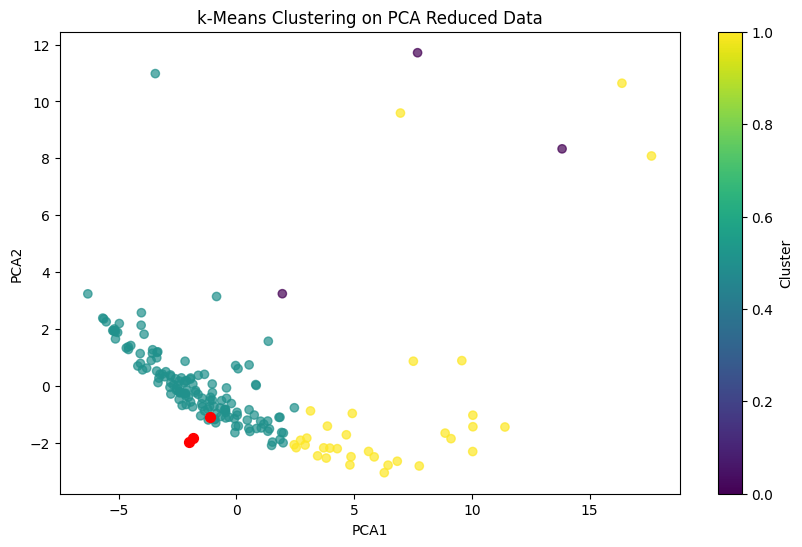

k-Means Confusion Matrix for test set - ArrowHead (test):
[[ 3 35 31]
 [ 0 53  0]
 [ 0 51  2]]
Homogeneity Score for k-Means: 0.17
Completeness Score for k-Means: 0.33
V-measure Score for k-Means: 0.23
Rand Score for k-Means: 0.49
Adjusted Rand Score for k-Means: 0.08

Random Forest Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.79      0.67      0.72        69
           1       0.65      0.64      0.65        53
           2       0.60      0.74      0.66        53

    accuracy                           0.68       175
   macro avg       0.68      0.68      0.68       175
weighted avg       0.69      0.68      0.68       175

Random Forest Confusion Matrix for test set - ArrowHead (test):
[[46  6 17]
 [10 34  9]
 [ 2 12 39]]

kNN DTW Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.84      0.71      0.77        69
      

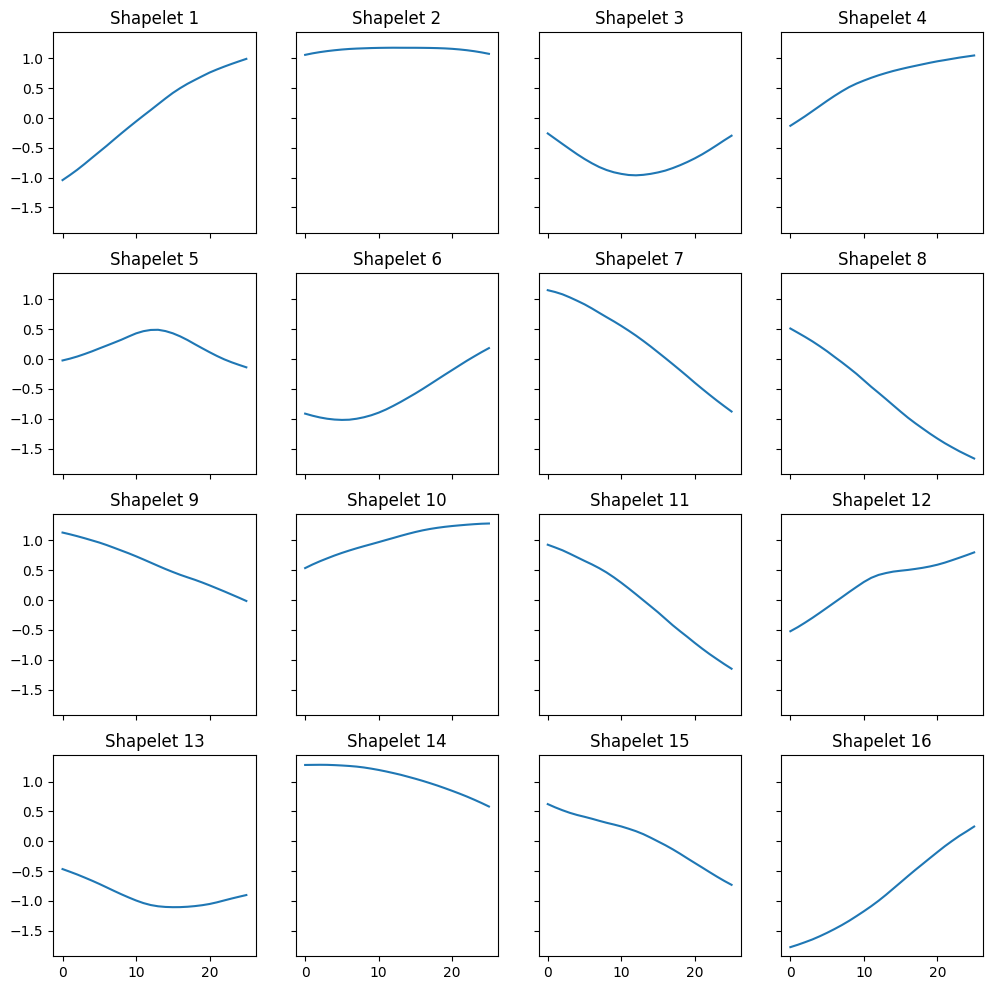

In [ ]:
model = TimeSeriesClassifier()
model.get_data("ArrowHead")
model.run(print_EDA=True, shapelets=True)

kNN Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.72      0.83      0.77        69
           1       0.82      0.70      0.76        53
           2       0.82      0.79      0.81        53

    accuracy                           0.78       175
   macro avg       0.79      0.77      0.78       175
weighted avg       0.78      0.78      0.78       175

kNN Confusion Matrix for test set - ArrowHead (test):
[[57  5  7]
 [14 37  2]
 [ 8  3 42]]



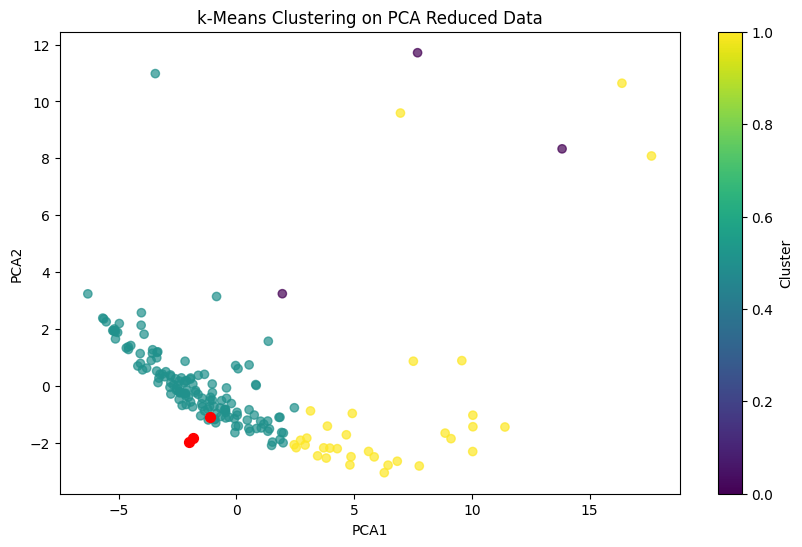

k-Means Confusion Matrix for test set - ArrowHead (test):
[[ 3 35 31]
 [ 0 53  0]
 [ 0 51  2]]
Homogeneity Score for k-Means: 0.17
Completeness Score for k-Means: 0.33
V-measure Score for k-Means: 0.23
Rand Score for k-Means: 0.49
Adjusted Rand Score for k-Means: 0.08

Random Forest Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.42      0.80      0.55        69
           1       0.59      0.43      0.50        53
           2       0.83      0.09      0.17        53

    accuracy                           0.47       175
   macro avg       0.62      0.44      0.41       175
weighted avg       0.60      0.47      0.42       175

Random Forest Confusion Matrix for test set - ArrowHead (test):
[[55 13  1]
 [30 23  0]
 [45  3  5]]

kNN DTW Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.60      0.77      0.68        69
      

In [ ]:
model = TimeSeriesClassifier()
model.get_data("ArrowHead")
model.augment_data()
model.run()

kNN Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.90      0.65      0.76        69
           1       0.68      0.85      0.76        53
           2       0.81      0.91      0.86        53

    accuracy                           0.79       175
   macro avg       0.80      0.80      0.79       175
weighted avg       0.81      0.79      0.79       175

kNN Confusion Matrix for test set - ArrowHead (test):
[[45 17  7]
 [ 4 45  4]
 [ 1  4 48]]



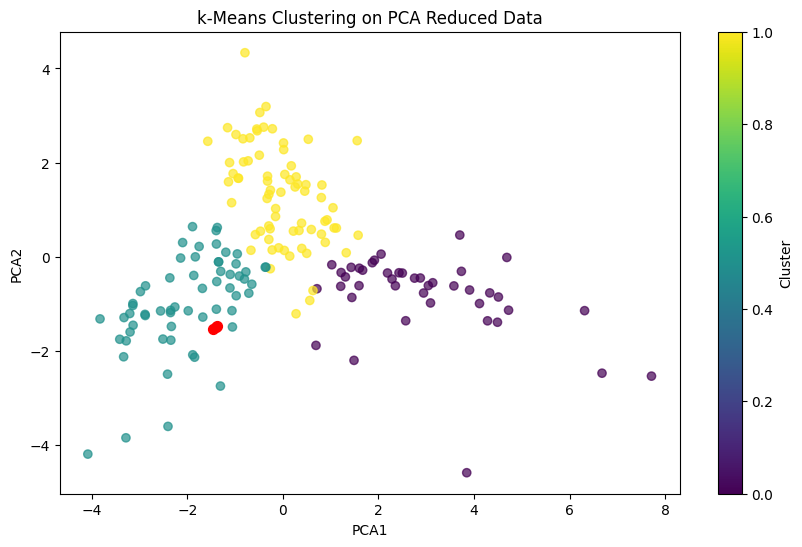

k-Means Confusion Matrix for test set - ArrowHead (test):
[[40  2 27]
 [ 0 17 36]
 [ 2 42  9]]
Homogeneity Score for k-Means: 0.36
Completeness Score for k-Means: 0.36
V-measure Score for k-Means: 0.36
Rand Score for k-Means: 0.69
Adjusted Rand Score for k-Means: 0.30

Random Forest Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.84      0.68      0.75        69
           1       0.73      0.70      0.71        53
           2       0.65      0.83      0.73        53

    accuracy                           0.73       175
   macro avg       0.74      0.74      0.73       175
weighted avg       0.75      0.73      0.73       175

Random Forest Confusion Matrix for test set - ArrowHead (test):
[[47  6 16]
 [ 8 37  8]
 [ 1  8 44]]

kNN DTW Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.92      0.51      0.65        69
      

In [ ]:
model = TimeSeriesClassifier()
model.get_data("ArrowHead")
model.feature_engineer_data()
model.run()

kNN Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.65      0.71      0.68        69
           1       0.65      0.60      0.63        53
           2       0.84      0.81      0.83        53

    accuracy                           0.71       175
   macro avg       0.72      0.71      0.71       175
weighted avg       0.71      0.71      0.71       175

kNN Confusion Matrix for test set - ArrowHead (test):
[[49 14  6]
 [19 32  2]
 [ 7  3 43]]



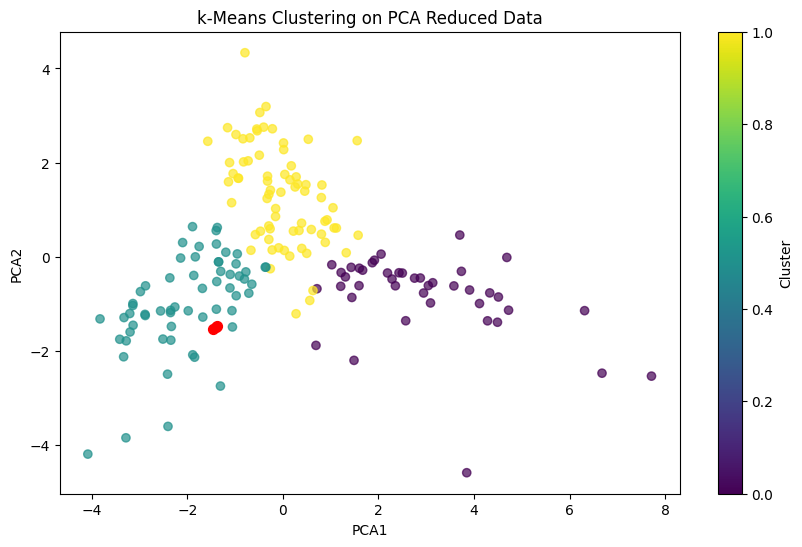

k-Means Confusion Matrix for test set - ArrowHead (test):
[[40  2 27]
 [ 0 17 36]
 [ 2 42  9]]
Homogeneity Score for k-Means: 0.36
Completeness Score for k-Means: 0.36
V-measure Score for k-Means: 0.36
Rand Score for k-Means: 0.69
Adjusted Rand Score for k-Means: 0.30

Random Forest Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.36      0.78      0.49        69
           1       0.31      0.09      0.14        53
           2       0.33      0.06      0.10        53

    accuracy                           0.35       175
   macro avg       0.34      0.31      0.24       175
weighted avg       0.34      0.35      0.27       175

Random Forest Confusion Matrix for test set - ArrowHead (test):
[[54  9  6]
 [48  5  0]
 [48  2  3]]

kNN DTW Classification Report for test set - ArrowHead (test):
              precision    recall  f1-score   support

           0       0.59      0.70      0.64        69
      

In [ ]:
model = TimeSeriesClassifier()
model.get_data("ArrowHead")
model.augment_data("scaling", scale_range=(0.95, 1.05))
model.feature_engineer_data()
model.run()

## GunPoint Test

In [ ]:
model = TimeSeriesClassifier()
model.get_data("GunPoint")
model.print_info()

Dataset: GunPoint
Shape of X_TRAIN: (50, 1, 150)
Shape of X_TEST: (150, 1, 150)
Labels: ['1' '2']


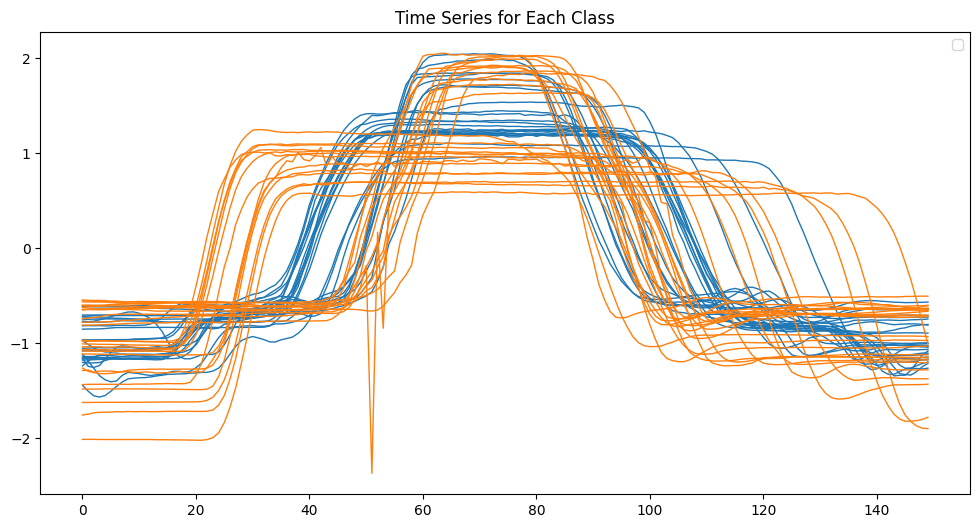

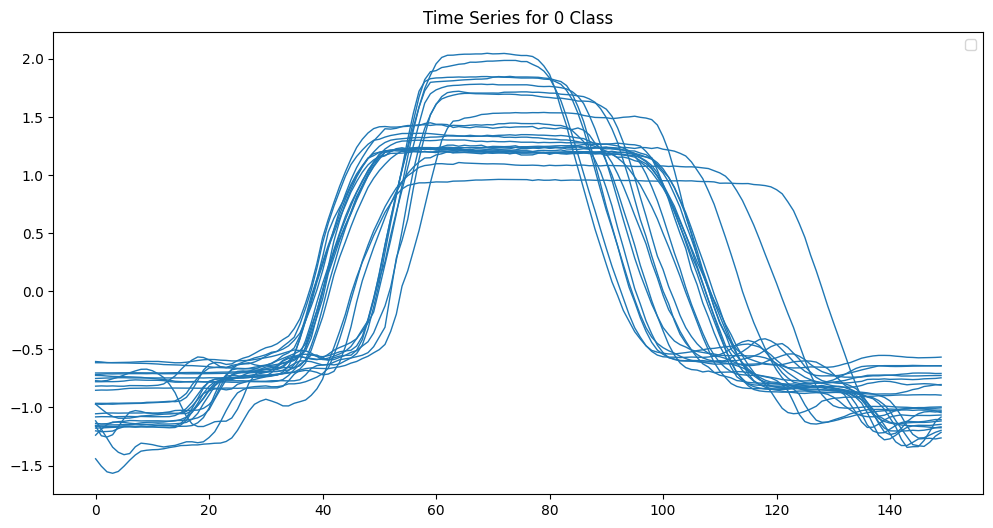

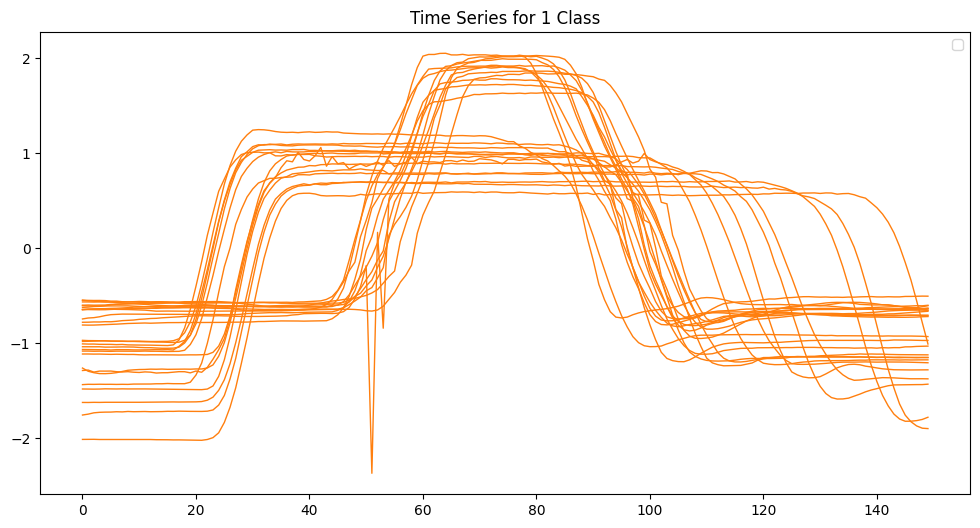

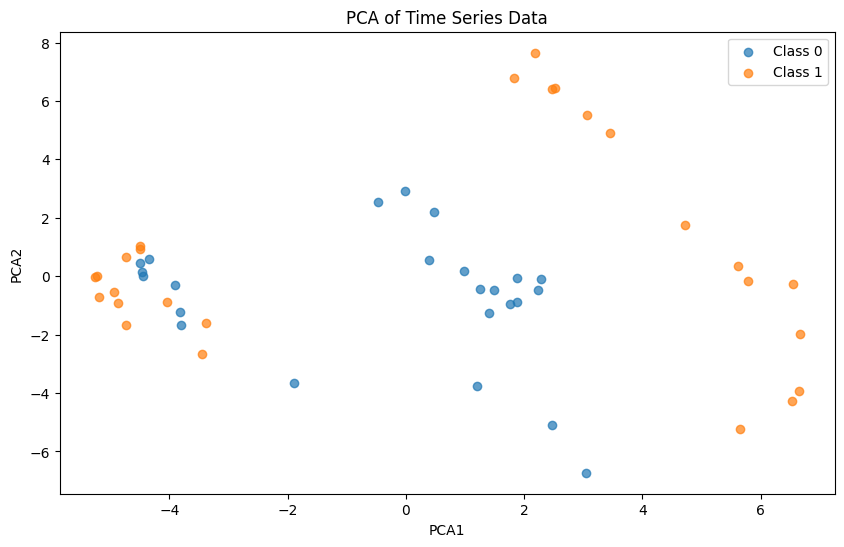

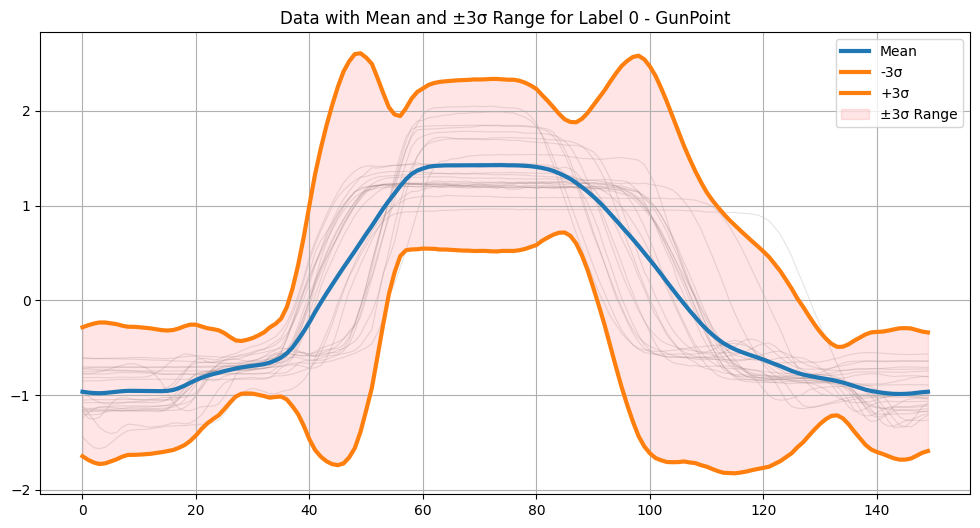

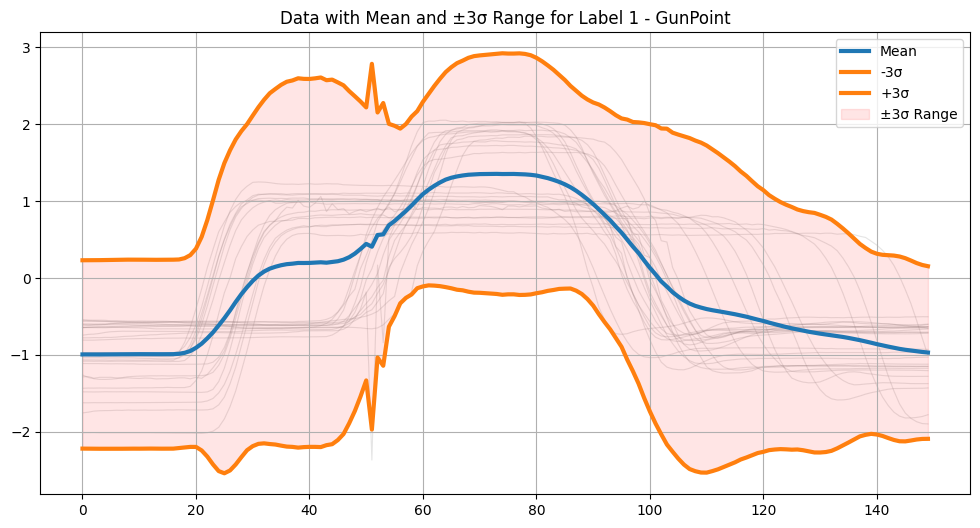

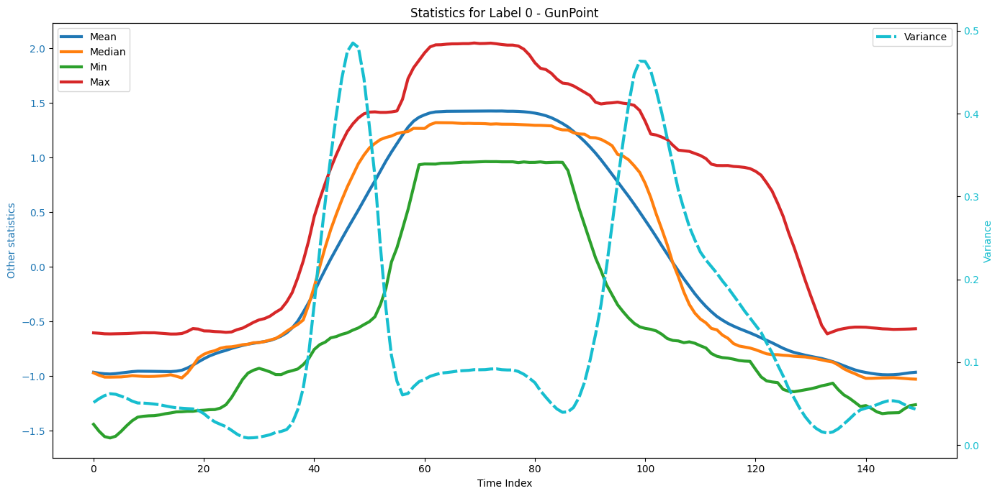

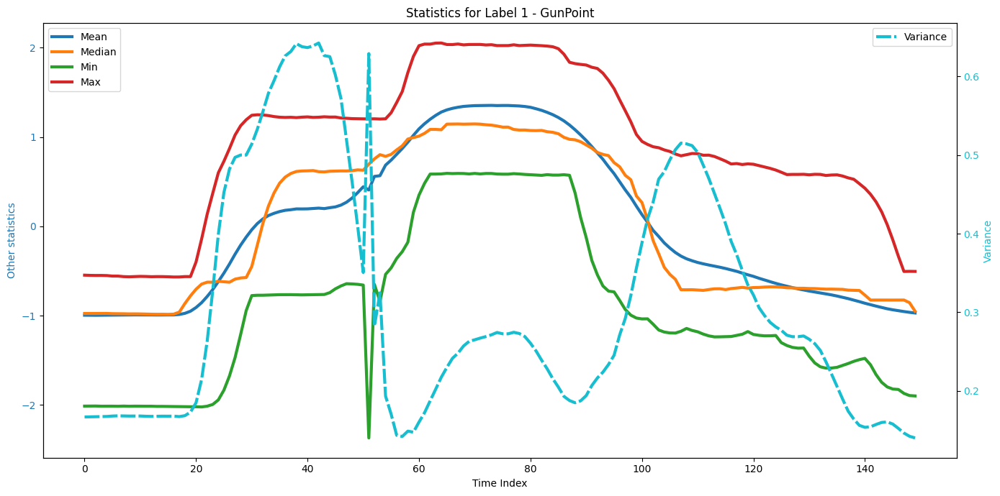

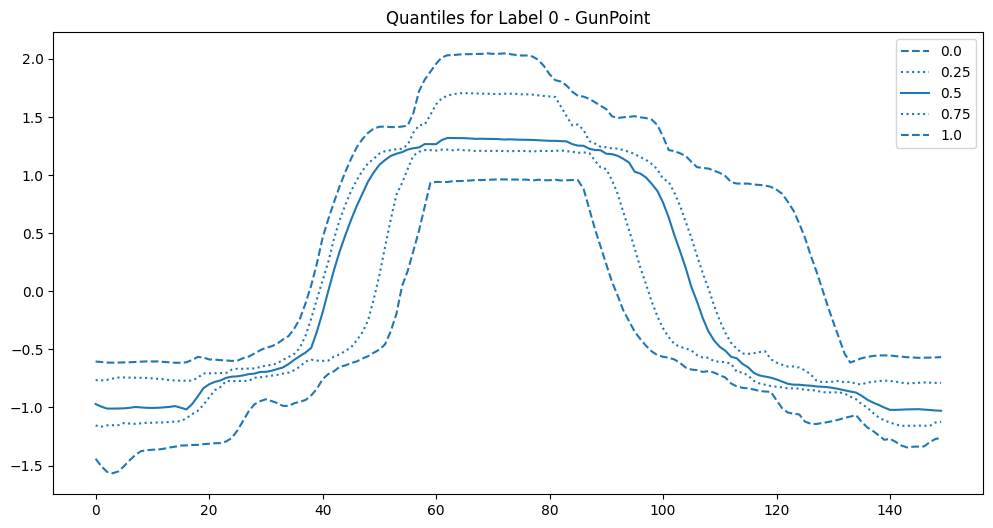

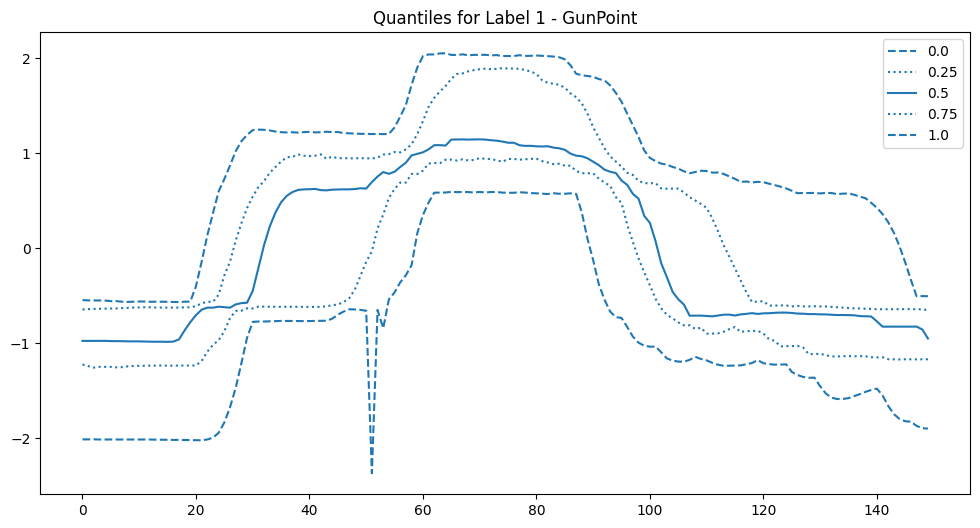

kNN Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.93      0.89      0.91        76
           1       0.90      0.93      0.91        74

    accuracy                           0.91       150
   macro avg       0.91      0.91      0.91       150
weighted avg       0.91      0.91      0.91       150

kNN Confusion Matrix for test set - GunPoint (test):
[[68  8]
 [ 5 69]]



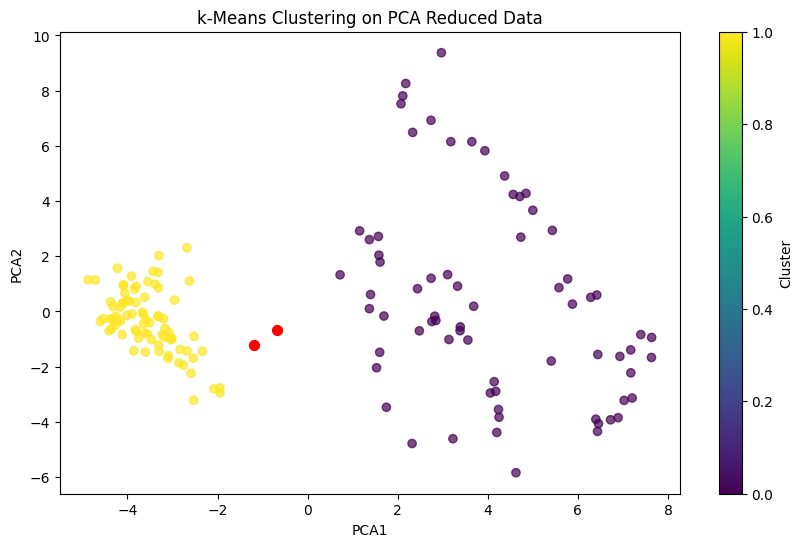

k-Means Confusion Matrix for test set - GunPoint (test):
[[34 42]
 [36 38]]
Homogeneity Score for k-Means: 0.00
Completeness Score for k-Means: 0.00
V-measure Score for k-Means: 0.00
Rand Score for k-Means: 0.50
Adjusted Rand Score for k-Means: -0.01

Random Forest Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.85      0.99      0.91        76
           1       0.98      0.82      0.90        74

    accuracy                           0.91       150
   macro avg       0.92      0.91      0.91       150
weighted avg       0.92      0.91      0.91       150

Random Forest Confusion Matrix for test set - GunPoint (test):
[[75  1]
 [13 61]]

kNN DTW Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.93      0.88      0.91        76
           1       0.88      0.93      0.91        74

    accuracy                           0.91 

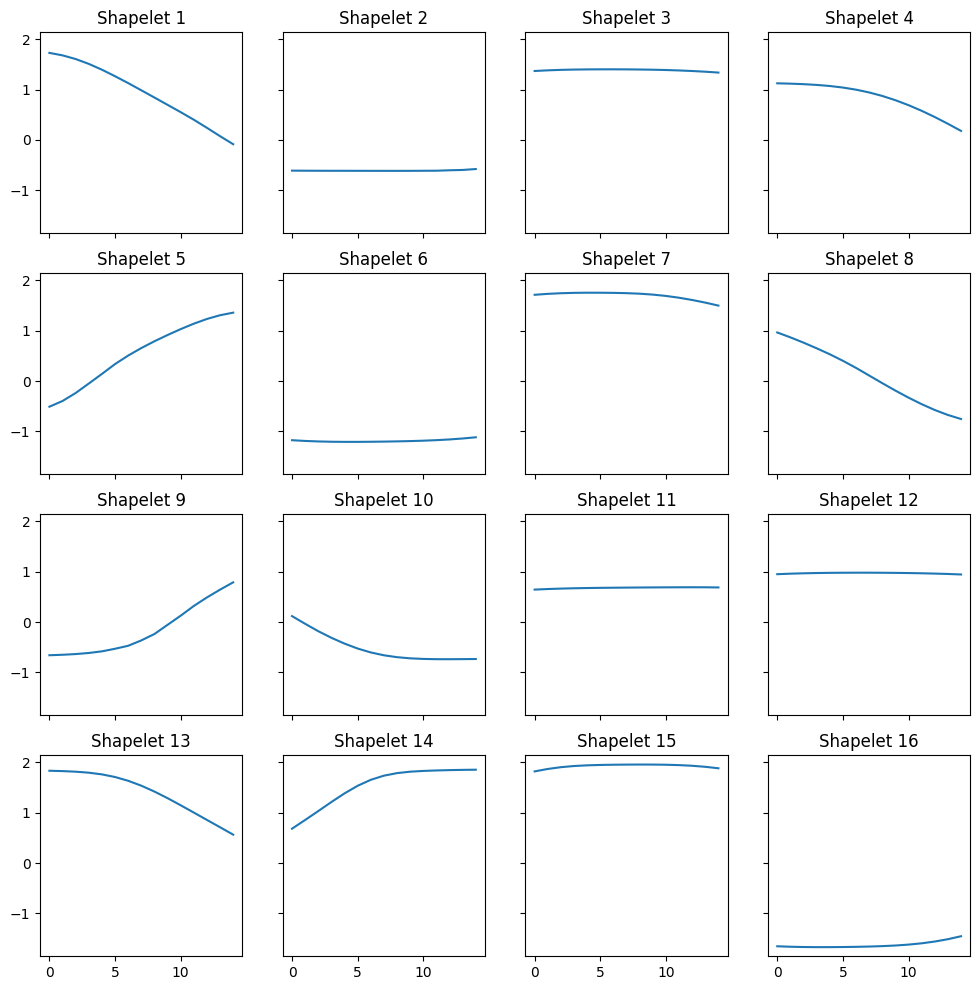

In [ ]:
model = TimeSeriesClassifier()
model.get_data("GunPoint")
model.run(print_EDA=True, shapelets=True)

kNN Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.92      0.64      0.76        76
           1       0.72      0.95      0.82        74

    accuracy                           0.79       150
   macro avg       0.82      0.80      0.79       150
weighted avg       0.82      0.79      0.79       150

kNN Confusion Matrix for test set - GunPoint (test):
[[49 27]
 [ 4 70]]



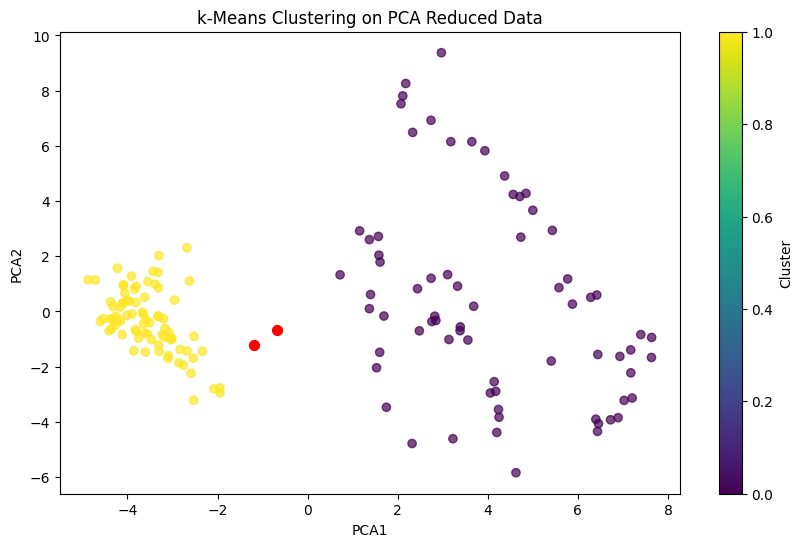

k-Means Confusion Matrix for test set - GunPoint (test):
[[34 42]
 [36 38]]
Homogeneity Score for k-Means: 0.00
Completeness Score for k-Means: 0.00
V-measure Score for k-Means: 0.00
Rand Score for k-Means: 0.50
Adjusted Rand Score for k-Means: -0.01

Random Forest Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.62      0.11      0.18        76
           1       0.50      0.93      0.65        74

    accuracy                           0.51       150
   macro avg       0.56      0.52      0.42       150
weighted avg       0.56      0.51      0.41       150

Random Forest Confusion Matrix for test set - GunPoint (test):
[[ 8 68]
 [ 5 69]]

kNN DTW Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.98      0.53      0.68        76
           1       0.67      0.99      0.80        74

    accuracy                           0.75 

In [ ]:
model = TimeSeriesClassifier()
model.get_data("GunPoint")
model.augment_data()
model.run()

kNN Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.86      0.91      0.88        76
           1       0.90      0.85      0.88        74

    accuracy                           0.88       150
   macro avg       0.88      0.88      0.88       150
weighted avg       0.88      0.88      0.88       150

kNN Confusion Matrix for test set - GunPoint (test):
[[69  7]
 [11 63]]



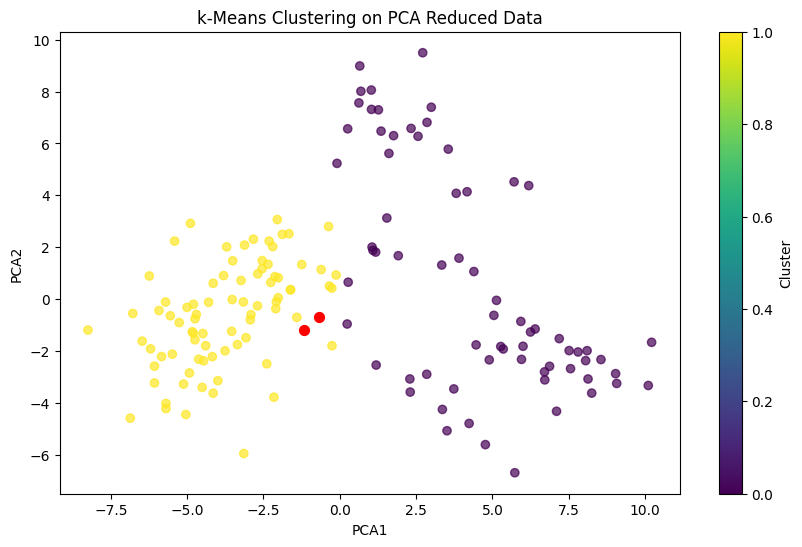

k-Means Confusion Matrix for test set - GunPoint (test):
[[33 43]
 [36 38]]
Homogeneity Score for k-Means: 0.00
Completeness Score for k-Means: 0.00
V-measure Score for k-Means: 0.00
Rand Score for k-Means: 0.50
Adjusted Rand Score for k-Means: -0.00

Random Forest Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        76
           1       0.97      0.97      0.97        74

    accuracy                           0.97       150
   macro avg       0.97      0.97      0.97       150
weighted avg       0.97      0.97      0.97       150

Random Forest Confusion Matrix for test set - GunPoint (test):
[[74  2]
 [ 2 72]]

kNN DTW Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        76
           1       0.80      0.80      0.80        74

    accuracy                           0.80 

In [ ]:
model = TimeSeriesClassifier()
model.get_data("GunPoint")
model.feature_engineer_data()
model.run()

kNN Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.92      0.75      0.83        76
           1       0.78      0.93      0.85        74

    accuracy                           0.84       150
   macro avg       0.85      0.84      0.84       150
weighted avg       0.85      0.84      0.84       150

kNN Confusion Matrix for test set - GunPoint (test):
[[57 19]
 [ 5 69]]



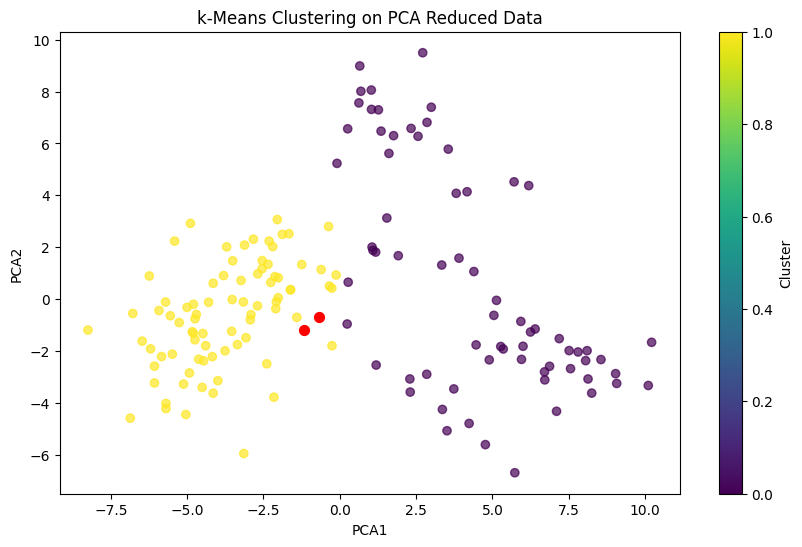

k-Means Confusion Matrix for test set - GunPoint (test):
[[33 43]
 [36 38]]
Homogeneity Score for k-Means: 0.00
Completeness Score for k-Means: 0.00
V-measure Score for k-Means: 0.00
Rand Score for k-Means: 0.50
Adjusted Rand Score for k-Means: -0.00

Random Forest Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       1.00      0.14      0.25        76
           1       0.53      1.00      0.69        74

    accuracy                           0.57       150
   macro avg       0.77      0.57      0.47       150
weighted avg       0.77      0.57      0.47       150

Random Forest Confusion Matrix for test set - GunPoint (test):
[[11 65]
 [ 0 74]]

kNN DTW Classification Report for test set - GunPoint (test):
              precision    recall  f1-score   support

           0       0.82      0.54      0.65        76
           1       0.65      0.88      0.75        74

    accuracy                           0.71 

In [ ]:
model = TimeSeriesClassifier()
model.get_data("GunPoint")
model.augment_data("scaling", scale_range=(0.95, 1.05))
model.feature_engineer_data()
model.run()

## SwedishLeaf Test

In [ ]:
model = TimeSeriesClassifier()
model.get_data("SwedishLeaf")
model.print_info()

Dataset: SwedishLeaf
Shape of X_TRAIN: (500, 1, 128)
Shape of X_TEST: (625, 1, 128)
Labels: ['1' '10' '11' '12' '13' '14' '15' '2' '3' '4' '5' '6' '7' '8' '9']


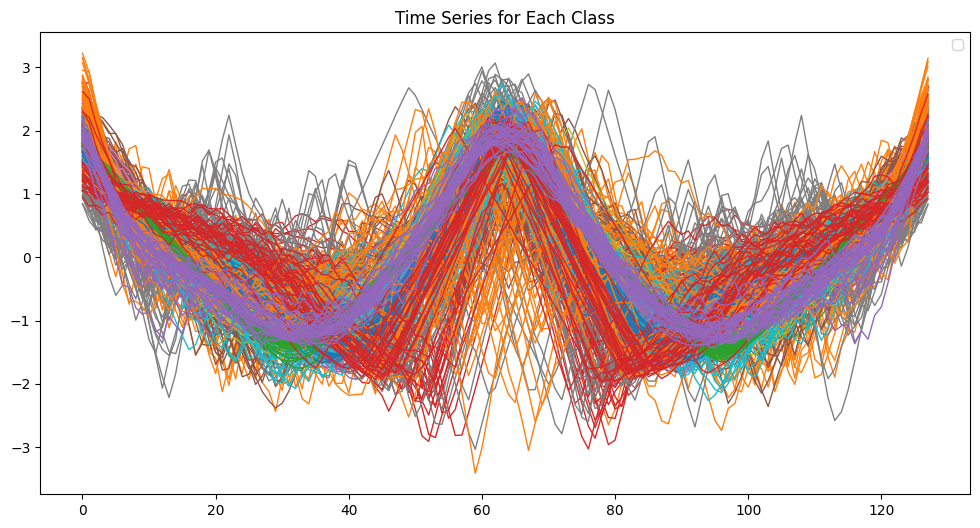

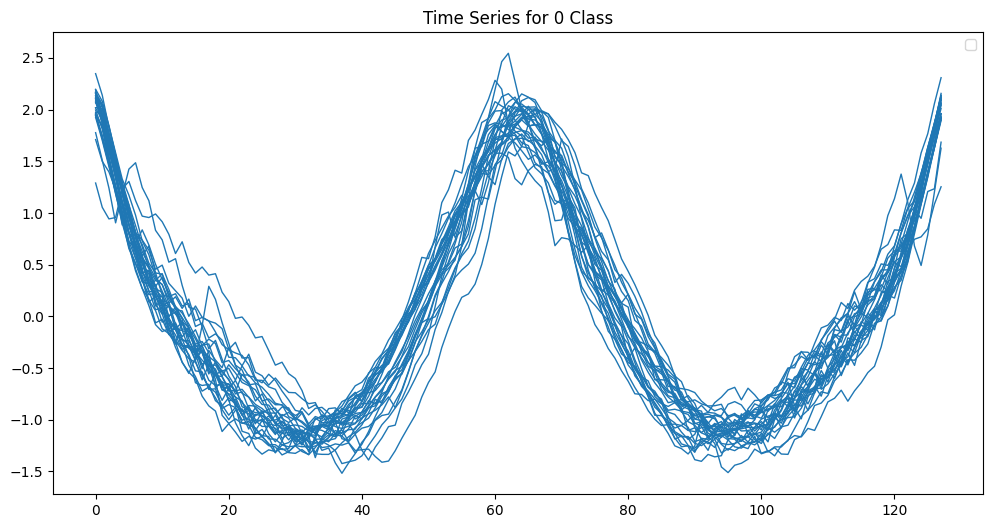

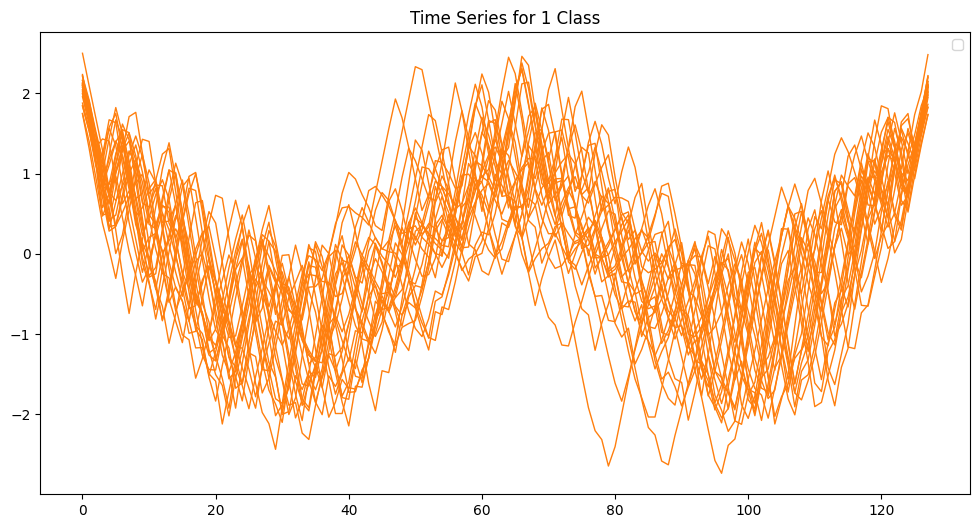

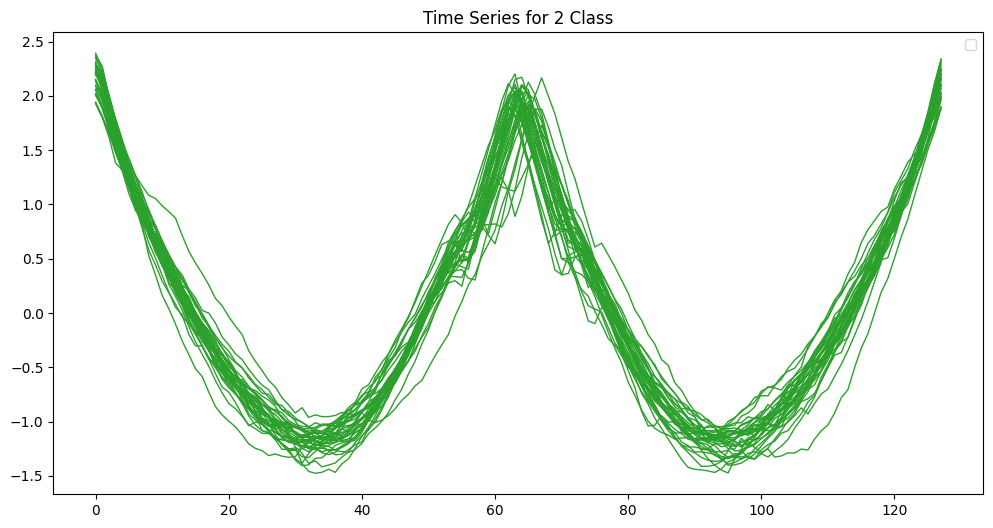

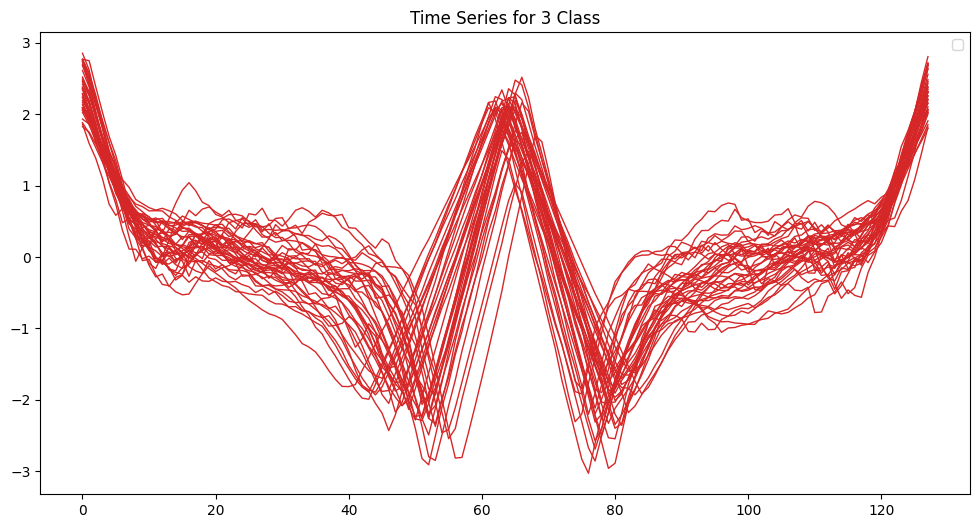

...

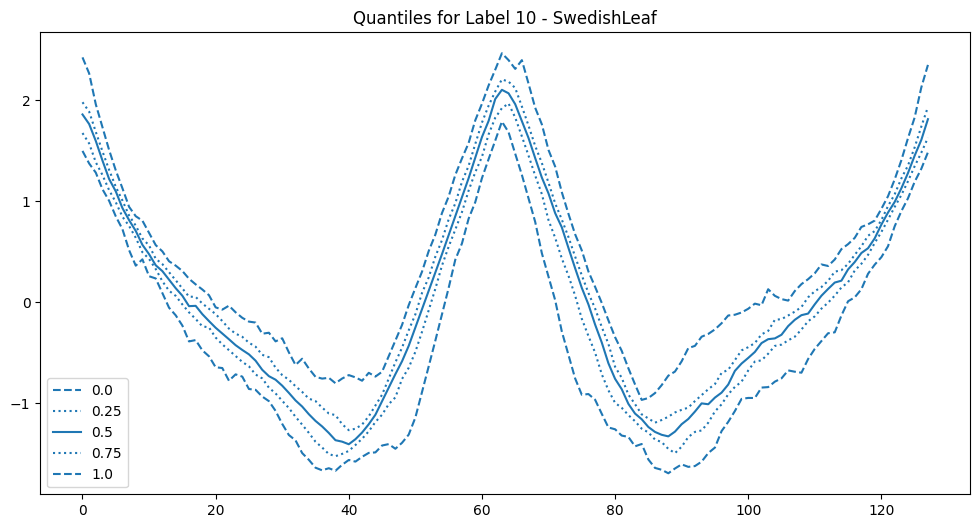

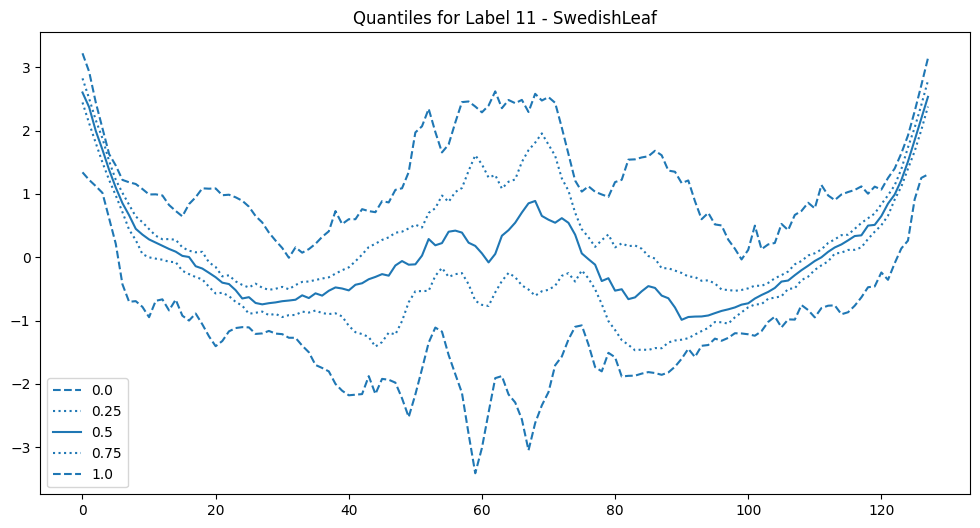

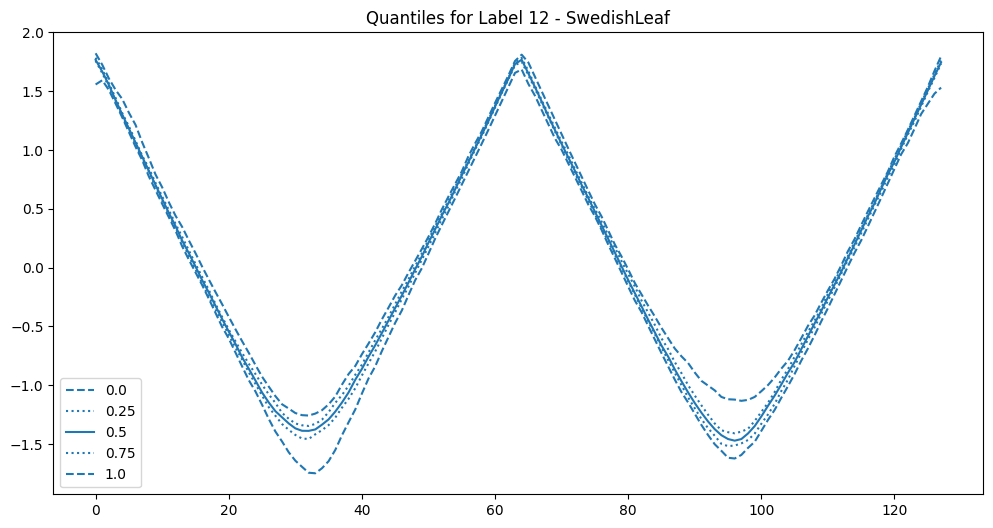

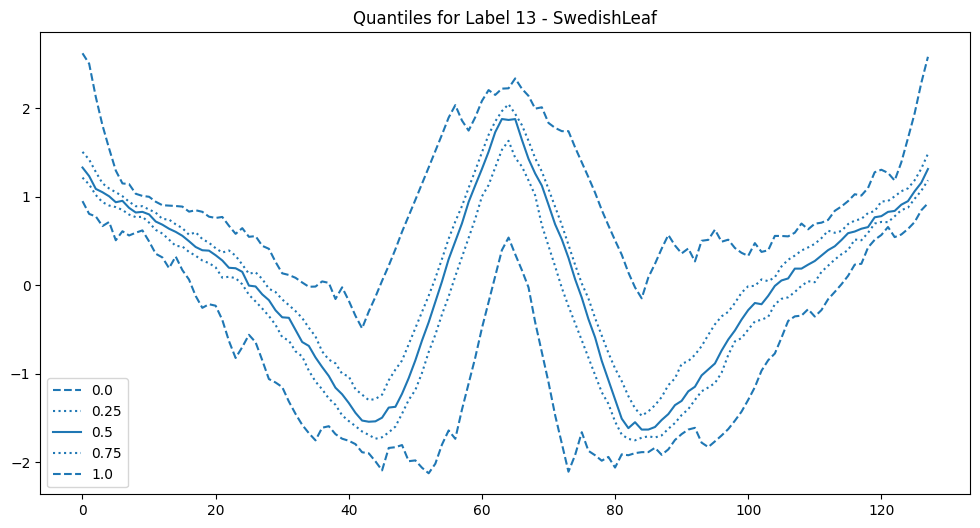

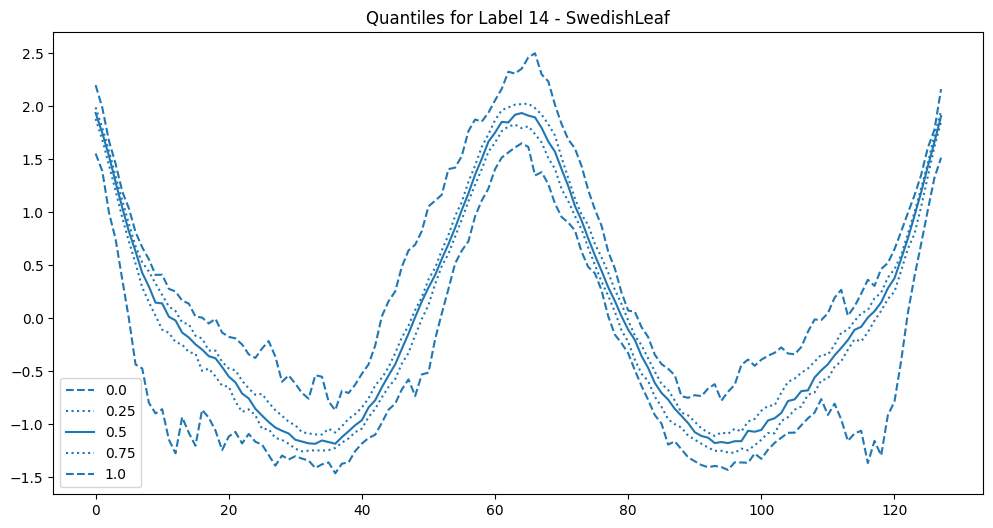

kNN Classification Report for test set - SwedishLeaf (test):
              precision    recall  f1-score   support

           0       0.81      0.65      0.72        46
           1       1.00      0.43      0.60        49
           2       0.63      0.97      0.76        40
           3       0.81      0.95      0.88        37
           4       0.85      0.83      0.84        42
           5       0.55      0.55      0.55        33
           6       0.83      0.97      0.90        40
           7       1.00      0.90      0.95        39
           8       0.63      0.72      0.67        40
           9       0.79      0.56      0.66        39
          10       0.72      0.81      0.76        42
          11       1.00      0.78      0.88        45
          12       0.94      1.00      0.97        47
          13       0.91      0.91      0.91        44
          14       0.61      0.81      0.69        42

    accuracy                           0.79       625
   macro avg       

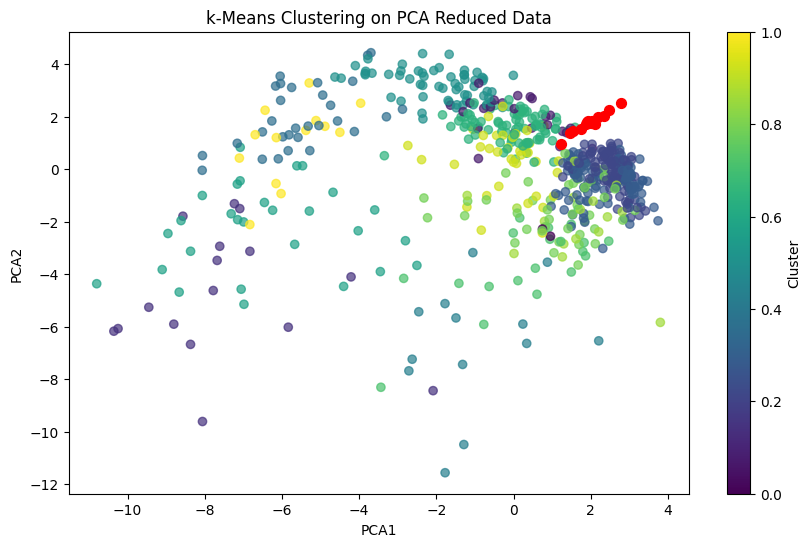

k-Means Confusion Matrix for test set - SwedishLeaf (test):
[[ 0  0  0 42  2  0  0  0  0  0  0  1  0  1  0]
 [ 2  0  0  0 16  0  0  0  0  0 13  8  9  1  0]
 [ 0  0  0  0 34  0  0  0  0  1  0  3  0  2  0]
 [ 0  0  8  0  0 13  0  1 14  0  0  0  0  1  0]
 [ 0  9  0  0  0  0  0 20  0 13  0  0  0  0  0]
 [ 0  0  0  0 11  0  0  0  0  0  4 15  2  1  0]
 [ 0  0  0  0  0  0  0  0  0 27  0  0  0 13  0]
 [ 0  1  7  0  0 12  0  2  3  0  1  0  0  0 13]
 [ 0  0  0  9 30  0  0  0  0  0  0  1  0  0  0]
 [ 0  9  0  0  4  0  0  0  0  7  1  3  3 12  0]
 [ 0  4  0  0  0  0  0  3  0 32  0  0  0  3  0]
 [ 0  0  1  0  0  0 13  0  9  3  1 10  1  7  0]
 [ 0  0  0  0 47  0  0  0  0  0  0  0  0  0  0]
 [ 0  2  0  0  0  5  0 34  2  0  0  0  1  0  0]
 [ 0  0  0 41  1  0  0  0  0  0  0  0  0  0  0]]
Homogeneity Score for k-Means: 0.53
Completeness Score for k-Means: 0.61
V-measure Score for k-Means: 0.57
Rand Score for k-Means: 0.88
Adjusted Rand Score for k-Means: 0.32

Random Forest Classification Report for test

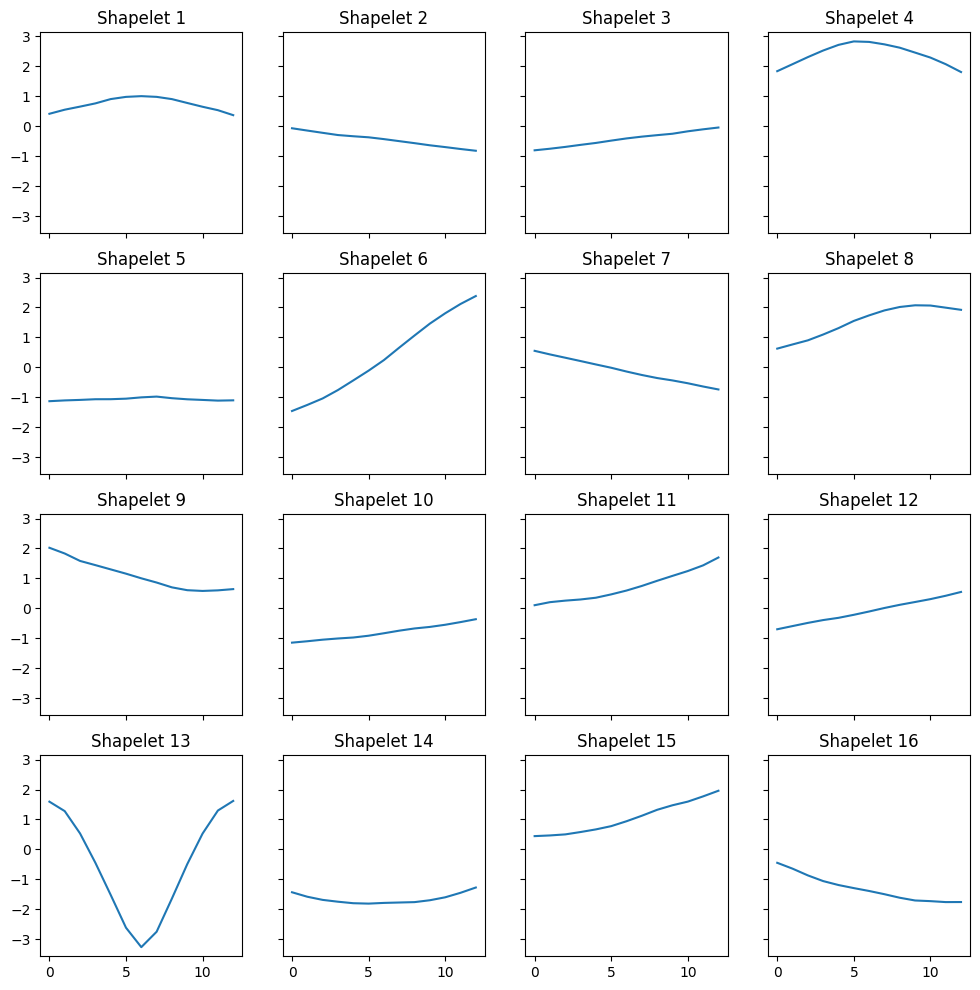

In [ ]:
model = TimeSeriesClassifier()
model.get_data("SwedishLeaf")
model.run(print_EDA=True, shapelets=True)

kNN Classification Report for test set - SwedishLeaf (test):
              precision    recall  f1-score   support

           0       0.57      0.35      0.43        46
           1       0.88      1.00      0.93        49
           2       0.76      0.88      0.81        40
           3       0.92      0.89      0.90        37
           4       0.86      0.88      0.87        42
           5       0.84      0.64      0.72        33
           6       0.77      0.93      0.84        40
           7       0.91      1.00      0.95        39
           8       0.82      0.68      0.74        40
           9       0.92      0.87      0.89        39
          10       0.73      0.71      0.72        42
          11       0.97      0.69      0.81        45
          12       0.96      1.00      0.98        47
          13       0.93      0.91      0.92        44
          14       0.51      0.79      0.62        42

    accuracy                           0.81       625
   macro avg       

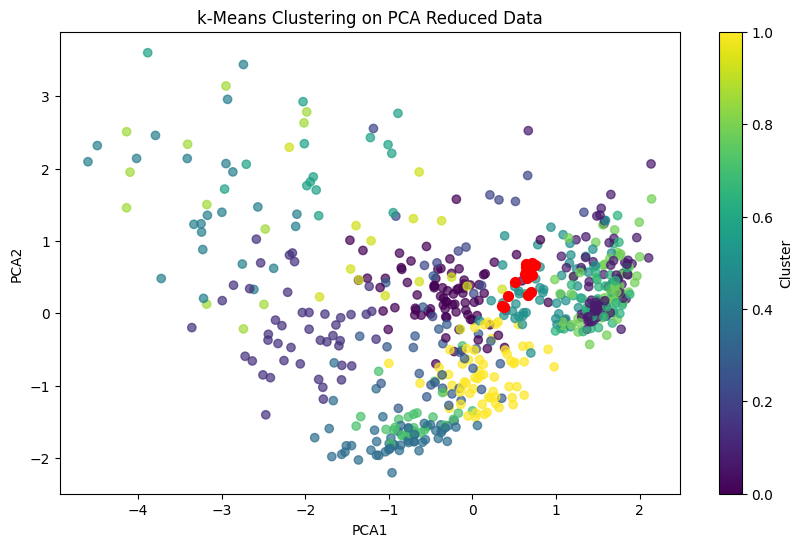

k-Means Confusion Matrix for test set - SwedishLeaf (test):
[[ 0  7  0  0  0  0  0  2  0 16  0 18  0  0  3]
 [47  0  0  0  2  0  0  0  0  0  0  0  0  0  0]
 [ 0 15  0  0  0  0  0 20  0  0  0  4  0  0  1]
 [ 0  0 13  0  0  2 10  0  2  0  0  0 10  0  0]
 [ 0  0  0  0  1  7  0  0  0  0 29  0  0  0  5]
 [23  0  0  4  0  0  0  3  0  0  0  0  0  3  0]
 [ 0  0  0  0  0  0  0 26  0  0  0  0  0  0 14]
 [ 0  0 23  0  1  4 11  0  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0  0  0  0 13  0  0  0]
 [10  0  0  0 19  0  0  0  0  0  0  0  0  2  8]
 [ 0  0  0  2  4  4  0  1  0  0  1  1  0  0 29]
 [ 1  1  5  9  2  0  2  0 13  0  0  0  1 10  1]
 [ 0 47  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  4  0  3 36  0  0  0  0  0  0  1  0  0]
 [ 0  5  0  0  0  0  0  0  0 21  0 15  0  0  1]]
Homogeneity Score for k-Means: 0.60
Completeness Score for k-Means: 0.64
V-measure Score for k-Means: 0.62
Rand Score for k-Means: 0.91
Adjusted Rand Score for k-Means: 0.39

Random Forest Classification Report for test

In [ ]:
model = TimeSeriesClassifier()
model.get_data("SwedishLeaf")
model.feature_engineer_data()
model.run()